**Pistache Types**

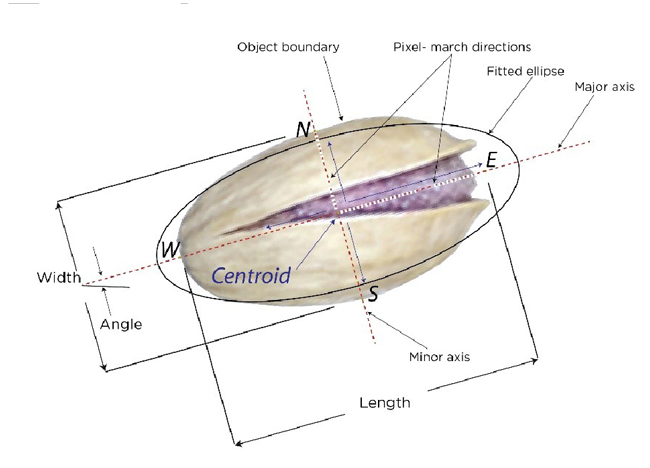

O Pistache é uma noz que apresenta uma forma "alongada", que possui múltiplas propriedades nutricionais e alto poder energético. Entre os  maiores produtores temos o Irã, Turquia e os Estados Unidos.
 Na  Turquia produção está concentrada nas espécies Kirmizi e Siirt por causa do valor econômico.

  As especies são:

*   Kirmizi: utilizada na  confeitaria (Devido a cor, sabor e aroma)
*   Siirt: usadas como aperitivos (alta taxa de quebra e formato mais arrendondado)

Para aumentar o valor de mercado do pistache, são necessárias a separação e a classificação automáticas de diferentes tipos de produtos provenientes de diferentes fornecedores.



 Obtido em: https://www.kaggle.com/datasets/amirhosseinmirzaie/pistachio-types-detection?sort=published




*   Area : A área da região do pistache detectada na imagem
*   Perimeter: O perímetro (comprimento total) do limite da região de pistache
*   Major_Axis: O comprimento do eixo maior da elipse que melhor se ajusta à região do pistache
*   Minor_axis: O comprimento do eixo menor da elipse que melhor se ajusta à região do pistache
*   Eccetricity: A excentricidade da elipse que descreve o alongamento da região do pistache
*   Eqdiaq: O diâmetro equivalente da região do pistache
*   Solidity: A razão entre a área da região do pistache e a área de seu casco convexo
*   Convex_area: A área do casco convexo da região do pistache
*   Extent: A razão entre a área da região do pistache e a área da caixa delimitadora que a envolve
*   Aspect_ratio: A razão entre o comprimento do eixo maior e o comprimento do eixo menor, indicando a forma da região do pistache
*   Roudness:  Uma medida de quão perto a região do pistache se assemelha a um círculo perfeito (circularidade)
*   Compactness: Uma medida de quão compacta é a forma da região do pistache
*   Shapefactor_1: um descritor geométrico calculado a partir da área e perímetro da região do pistache
*   Shapefactor_2: outro descritor geométrico calculado a partir da área e perímetro da região do pistache
*   Shapefactor_3: um descritor geométrico derivado da área e perímetro da região do pistache
*   Shapefactor_4: outro descritor geométrico derivado da área e perímetro da região do pistache
*   Class (variável Target): A classe ou categoria do pistache





>


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.svm import SVC
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.metrics import f1_score, accuracy_score
import plotly.express as px
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

In [ ]:
df = pd.read_csv('/content/pistachio.csv')
df.describe()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4
count,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000
mean,79871.952852,1421.797588,446.206444,238.193128,0.840347,317.790000,0.940103,84947.671129,0.716055,1.899342,0.570831,0.712841,0.005704,0.003017,0.510097,0.955185
std,12968.217051,373.408835,31.885328,30.426445,0.049026,26.571699,0.050006,13081.742551,0.052534,0.241253,0.211514,0.044230,0.000810,0.000334,0.063391,0.051735
min,29808.000000,858.363000,321.425500,133.509600,0.504900,194.814600,0.588000,37935.000000,0.427200,1.158500,0.062800,0.476000,0.004000,0.002400,0.226600,0.620400
25%,71898.500000,1169.633225,426.554100,217.875475,0.817500,302.562375,0.920250,76357.750000,0.688100,1.736325,0.372325,0.682000,0.005200,0.002800,0.465125,0.944200
50%,79795.000000,1260.785500,448.453150,235.888750,0.850250,318.744650,0.953800,84973.000000,0.726100,1.899550,0.643850,0.709750,0.005600,0.003000,0.503750,0.972800
75%,88980.000000,1599.479000,467.515200,257.433625,0.875375,336.590000,0.976300,93660.750000,0.753600,2.068575,0.744450,0.741600,0.006100,0.003200,0.549975,0.986800
max,124008.000000,2755.049100,535.642200,383.046100,0.946000,397.356100,0.995100,132478.000000,0.820400,3.085800,0.933600,0.869500,0.013100,0.005300,0.756100,0.999000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1718 entries, 0 to 1717
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AREA           1718 non-null   int64  
 1   PERIMETER      1718 non-null   float64
 2   MAJOR_AXIS     1718 non-null   float64
 3   MINOR_AXIS     1718 non-null   float64
 4   ECCENTRICITY   1718 non-null   float64
 5   EQDIASQ        1718 non-null   float64
 6   SOLIDITY       1718 non-null   float64
 7   CONVEX_AREA    1718 non-null   int64  
 8   EXTENT         1718 non-null   float64
 9   ASPECT_RATIO   1718 non-null   float64
 10  ROUNDNESS      1718 non-null   float64
 11  COMPACTNESS    1718 non-null   float64
 12  SHAPEFACTOR_1  1718 non-null   float64
 13  SHAPEFACTOR_2  1718 non-null   float64
 14  SHAPEFACTOR_3  1718 non-null   float64
 15  SHAPEFACTOR_4  1718 non-null   float64
 16  Class          1718 non-null   object 
dtypes: float64(14), int64(2), object(1)
memory usage: 22

In [ ]:
df.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,Class
0,73107,1161.8070,442.4074,217.7261,0.8705,305.0946,0.9424,77579,0.7710,2.0319,0.6806,0.6896,0.0061,0.0030,0.4756,0.9664,Kirmizi_Pistachio
1,89272,1173.1810,460.2551,251.9546,0.8369,337.1419,0.9641,92598,0.7584,1.8267,0.8151,0.7325,0.0052,0.0028,0.5366,0.9802,Siit_Pistachio
2,60955,999.7890,386.9247,209.1255,0.8414,278.5863,0.9465,64400,0.7263,1.8502,0.7663,0.7200,0.0063,0.0034,0.5184,0.9591,Kirmizi_Pistachio
3,79537,1439.5129,466.7973,221.2136,0.8806,318.2289,0.9437,84281,0.7568,2.1102,0.4823,0.6817,0.0059,0.0028,0.4648,0.9807,Kirmizi_Pistachio
4,96395,1352.6740,515.8730,246.5945,0.8784,350.3340,0.9549,100950,0.7428,2.0920,0.6620,0.6791,0.0054,0.0026,0.4612,0.9648,Kirmizi_Pistachio


In [ ]:
# Verificar duplicidade de dados
if df.duplicated().any():
    print("Existem dados duplicados no DataFrame.")
else:
    print("Não foram encontrados dados duplicados no DataFrame.")

Não foram encontrados dados duplicados no DataFrame.


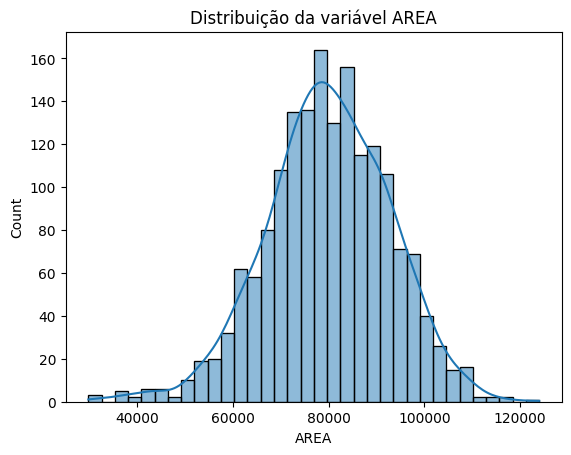

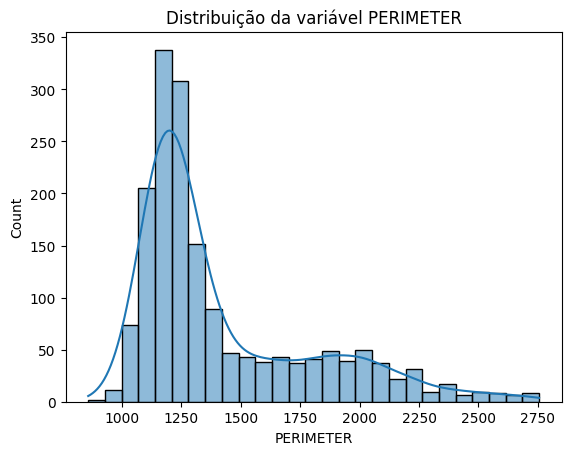

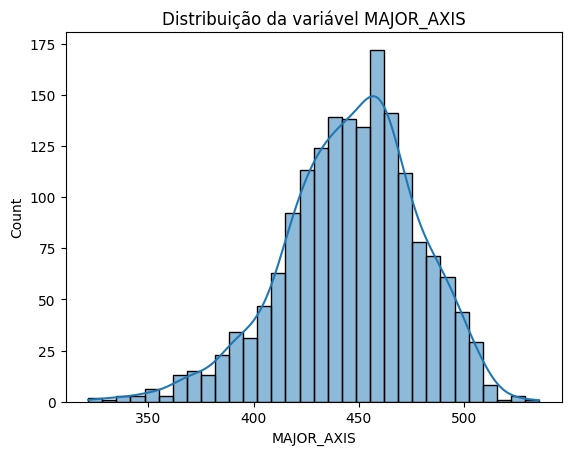

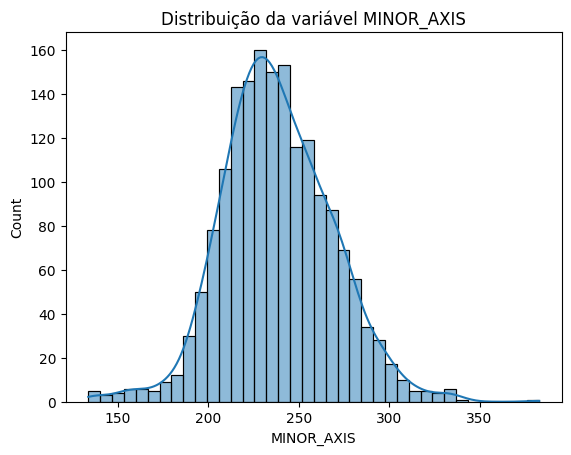

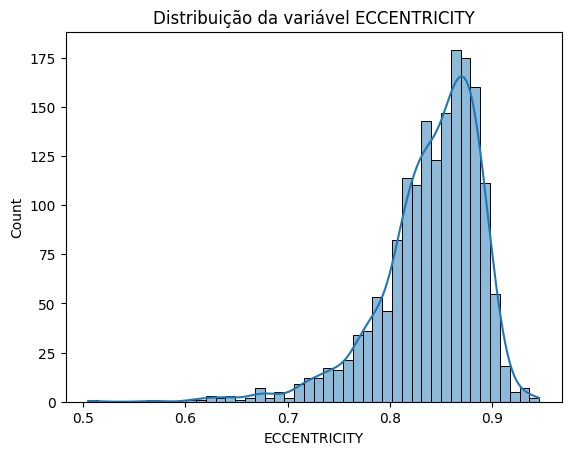

...

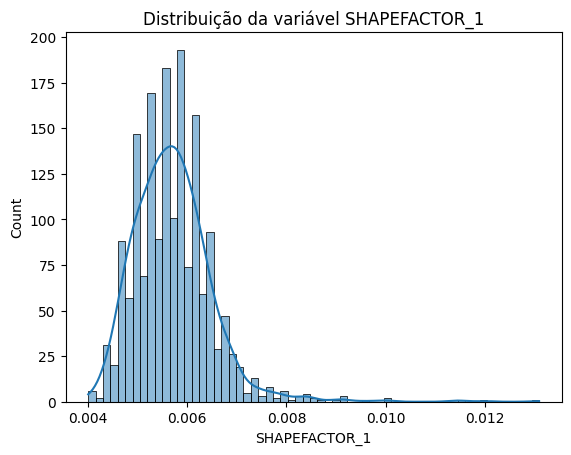

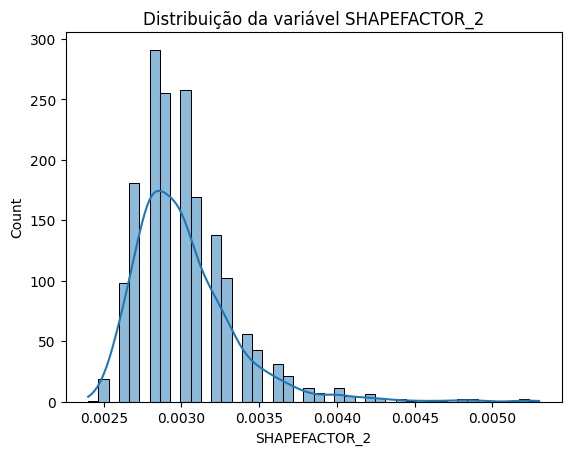

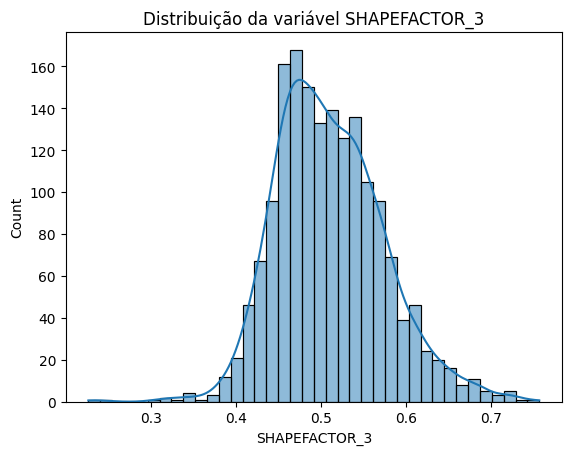

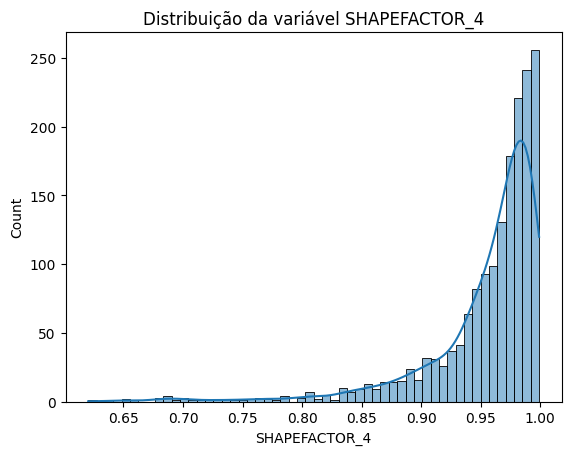

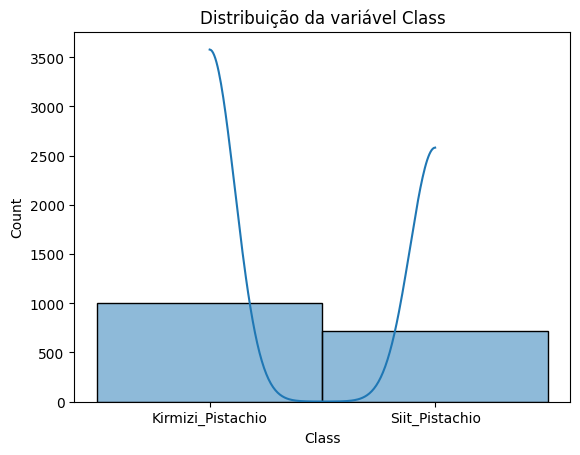

In [ ]:
for col in df:

    sns.histplot(data=df, x=col, kde=True).set_title(f"Distribuição da variável {col}")
    plt.show()

distribuição do target(y)

In [ ]:
df['Class'].value_counts()

Kirmizi_Pistachio    998
Siit_Pistachio       720
Name: Class, dtype: int64

In [ ]:
fig = px.pie(df, names='Class', title='Proporção das classes')
fig.update_layout(
    title={
        'text': "Proporção das classes",
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    title_font=dict(size=25, family='Arial', color='black')
)
fig.show()

<ipython-input-9-64d7750164fb>:5: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



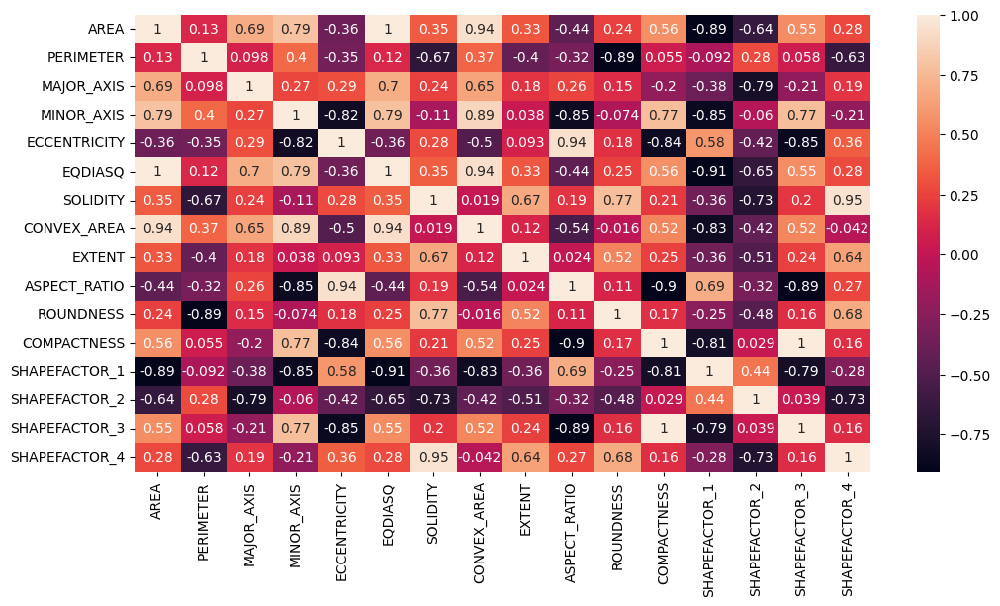

In [ ]:
### Correlação dos dados

plt.figure(figsize=(12, 6))

sns.heatmap(df.corr(), annot=True);

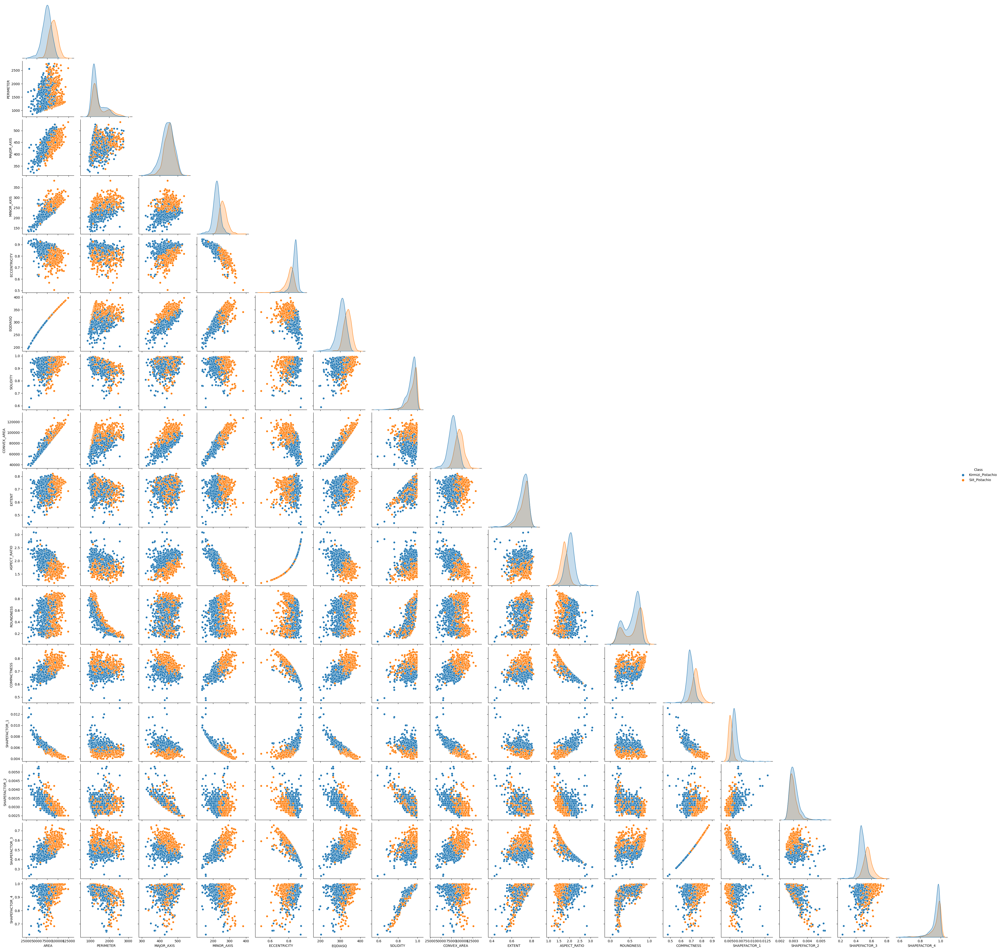

In [ ]:
sns.pairplot(df, hue = 'Class', corner=True)

**Aprendizado Supervisionado**

Criando um pipeline de pré-processamento

In [ ]:
def pipe_pre_process():

    # Carregamento de dados
    df = pd.read_csv('pistachio.csv')

    # Definição de features e target
    X = df.drop(columns='Class')
    y = df["Class"]

    # Particionamento dos conjuntos de treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42, stratify = y)

    #================================
    # Tratamento das features (apenas numéricas)
    pipe_features_num = Pipeline([("scaler", StandardScaler())]) # padronização dos dados

    features_num = X_train.select_dtypes(include=np.number).columns.tolist() # Transformando de panda.dataframe para lista
    #==============================

    # Aplicando as transformações nos dados
    pre_processador = ColumnTransformer([("transf_num", pipe_features_num, features_num)])

    return X_train, X_test, y_train, y_test, pre_processador

In [ ]:
def metricas_classificacao(estimator):
    #=================
    print("\nMétricas da avaliação de treino:")

    y_pred_train = estimator.predict(X_train) # predição sobre os dados de treinamento

    print(confusion_matrix(y_train, y_pred_train)) # matriz de confusão

    ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train)
    plt.show()

    print(classification_report(y_train, y_pred_train))

    #=================
    print("\nMétricas da avaliação de teste:")

    y_pred_test = estimator.predict(X_test) # predição sobre os dados de treinamento

    print(confusion_matrix(y_test, y_pred_test)) # matriz de confusão

    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test)
    plt.show()

    print(classification_report(y_test, y_pred_test))

## Modelo de Classificação usando: Support Vector Machine (SVM) com o método de GridSearch para encontrar os melhores hiperparâmetros para o modelo.##


In [ ]:
# Primeiro, vamos usar nossa função de pré-processamento dos dados
X_train, X_test, y_train, y_test, pre_processador = pipe_pre_process()

# Preparando os dados e instanciando o modelo
pipe_svc = Pipeline([('pre_process', pre_processador),
                    ('svc', SVC(random_state=42))]) # valores-padrão: kernel = 'rbf', C = '1', gamma = 'scale'
pipe_svc.fit(X_train,y_train)

# Escolhendo os parâmetros para o gridsearch
param_grid_svc = {"svc__kernel": ["linear", "poly", 'rbf'],
                 "svc__C": [0.5, 1 , 10],
                  'svc__tol': [0.1, 0.001, 0.00001]}

splitter = StratifiedKFold(n_splits=5, shuffle = True, random_state = 42)

grid_svc = GridSearchCV(estimator= pipe_svc,
                       param_grid= param_grid_svc,
                       cv=splitter,
                       verbose= 10,
                       n_jobs= -1)
grid_svc.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('pre_process',
                                        ColumnTransformer(transformers=[('transf_num',
                                                                         Pipeline(steps=[('scaler',
                                                                                          StandardScaler())]),
                                                                         ['AREA',
                                                                          'PERIMETER',
                                                                          'MAJOR_AXIS',
                                                                          'MINOR_AXIS',
                                                                          'ECCENTRICITY',
                                                                          'EQDIASQ',
                                                                          'SOLIDITY',
                                                                          'CONVEX_AREA',
                                                                          'EXTENT',
                                                                          'ASPECT_RATIO',
                                                                          'ROUNDNESS',
                                                                          'COMPACTNESS',
                                                                          'SHAPEFACTOR_1',
                                                                          'SHAPEFACTOR_2',
                                                                          'SHAPEFACTOR_3',
                                                                          'SHAPEFACTOR_4'])])),
                                       ('svc', SVC(random_state=42))]),
             n_jobs=-1,
             param_grid={'svc__C': [0.5, 1, 10],
                         'svc__kernel': ['linear', 'poly', 'rbf'],
                         'svc__tol': [0.1, 0.001, 1e-05]},
             verbose=10)


Métricas da avaliação de treino:
[[632  66]
 [ 74 430]]


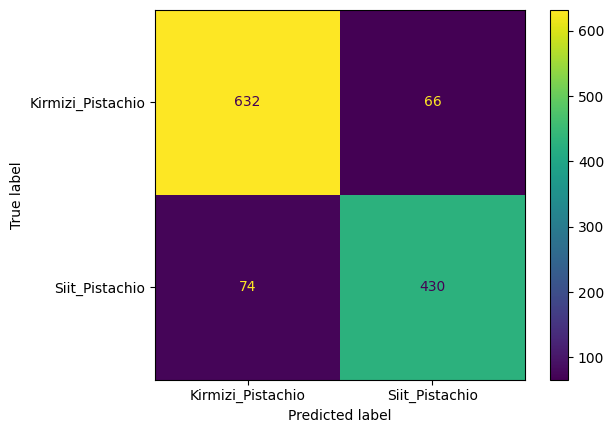

                   precision    recall  f1-score   support

Kirmizi_Pistachio       0.90      0.91      0.90       698
   Siit_Pistachio       0.87      0.85      0.86       504

         accuracy                           0.88      1202
        macro avg       0.88      0.88      0.88      1202
     weighted avg       0.88      0.88      0.88      1202


Métricas da avaliação de teste:
[[277  23]
 [ 38 178]]


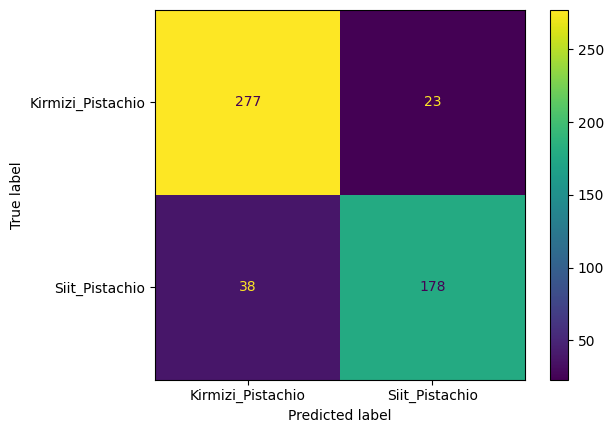

                   precision    recall  f1-score   support

Kirmizi_Pistachio       0.88      0.92      0.90       300
   Siit_Pistachio       0.89      0.82      0.85       216

         accuracy                           0.88       516
        macro avg       0.88      0.87      0.88       516
     weighted avg       0.88      0.88      0.88       516



In [ ]:
metricas_classificacao(grid_svc)

##Tentamos otimizar os resultados realizando o balanceamento

##Support Vector Machine (SVM) com kernel linear, polinomial e radial (RBF).##

In [ ]:
# Primeiro, vamos usar nossa função de pré-processamento dos dados
X_train, X_test, y_train, y_test, pre_processador = pipe_pre_process()

# Preparando os dados e instanciando o modelo
pipe_svc = Pipeline([('pre_process', pre_processador),
                    ('svc', SVC(random_state=42, class_weight = 'balanced'))]) # valores-padrão: kernel = 'rbf', C = '1', gamma = 'scale'
pipe_svc.fit(X_train,y_train)

# Escolhendo os parâmetros para o gridsearch
param_grid_svc = {"svc__kernel": ["linear", "poly", 'rbf'],
                 "svc__C": [0.5, 1 , 10],
                  'svc__tol': [0.1, 0.001, 0.00001]}

splitter = StratifiedKFold(n_splits=5, shuffle = True, random_state = 42)

grid_svc_balanc = GridSearchCV(estimator= pipe_svc,
                       param_grid= param_grid_svc,
                       cv=splitter,
                       verbose= 10,
                       n_jobs= -1)
grid_svc_balanc.fit(X_train, y_train)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('pre_process',
                                        ColumnTransformer(transformers=[('transf_num',
                                                                         Pipeline(steps=[('scaler',
                                                                                          StandardScaler())]),
                                                                         ['AREA',
                                                                          'PERIMETER',
                                                                          'MAJOR_AXIS',
                                                                          'MINOR_AXIS',
                                                                          'ECCENTRICITY',
                                                                          'EQDIASQ',
                                                                          'SOLIDITY',
                                                                          'CONVEX_AREA',
                                                                          'EXTENT',
                                                                          'ASPECT_RATIO',
                                                                          'ROUNDNESS',
                                                                          'COMPACTNESS',
                                                                          'SHAPEFACTOR_1',
                                                                          'SHAPEFACTOR_2',
                                                                          'SHAPEFACTOR_3',
                                                                          'SHAPEFACTOR_4'])])),
                                       ('svc',
                                        SVC(class_weight='balanced',
                                            random_state=42))]),
             n_jobs=-1,
             param_grid={'svc__C': [0.5, 1, 10],
                         'svc__kernel': ['linear', 'poly', 'rbf'],
                         'svc__tol': [0.1, 0.001, 1e-05]},
             verbose=10)


Métricas da avaliação de treino:
[[615  83]
 [ 60 444]]


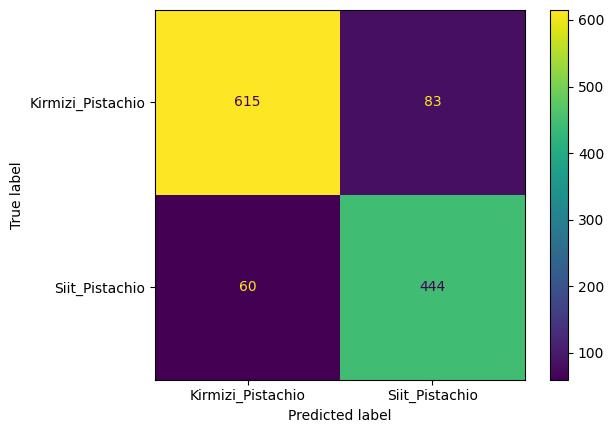

                   precision    recall  f1-score   support

Kirmizi_Pistachio       0.91      0.88      0.90       698
   Siit_Pistachio       0.84      0.88      0.86       504

         accuracy                           0.88      1202
        macro avg       0.88      0.88      0.88      1202
     weighted avg       0.88      0.88      0.88      1202


Métricas da avaliação de teste:
[[274  26]
 [ 32 184]]


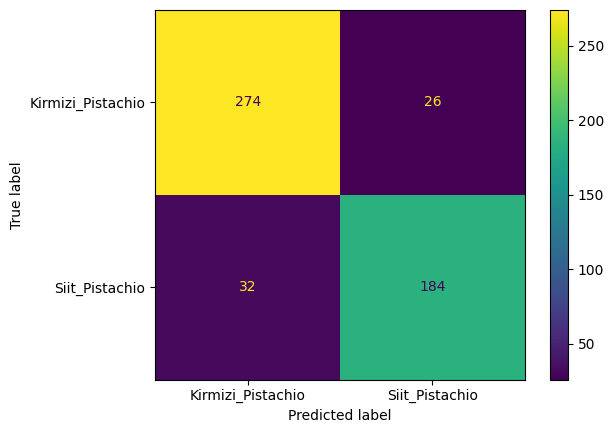

                   precision    recall  f1-score   support

Kirmizi_Pistachio       0.90      0.91      0.90       300
   Siit_Pistachio       0.88      0.85      0.86       216

         accuracy                           0.89       516
        macro avg       0.89      0.88      0.88       516
     weighted avg       0.89      0.89      0.89       516



In [ ]:
metricas_classificacao(grid_svc_balanc)

### Como pôde ser observado, não houve uma diferença significativa com o balanceamento dos dados

##Modelo de classificação:usando o classificação em um método de boosting##


In [ ]:
! pip install xgboost

In [ ]:
from xgboost import XGBClassifier
from xgboost import plot_importance

In [ ]:
def pipe_pre_process():

    # Carregamento de dados
    df = pd.read_csv('pistachio.csv')

    # Transformando os dados categóricos em numéricos
    label_encoder = LabelEncoder()

    df['Class'] = label_encoder.fit_transform(df['Class'])

    # Definição de features e target
    X = df.drop(columns='Class')
    y = df["Class"]

    # Particionamento dos conjuntos de treino e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42, stratify = y)

    #================================
    # Tratamento das features (apenas numéricas)
    pipe_features_num = Pipeline([("scaler", StandardScaler())]) # padronização dos dados

    features_num = X_train.select_dtypes(include=np.number).columns.tolist() # Transformando de panda.dataframe para lista
    #==============================

    # Aplicando as transformações nos dados
    pre_processador = ColumnTransformer([("transf_num", pipe_features_num, features_num)])

    return X_train, X_test, y_train, y_test, pre_processador

In [ ]:
# Separando em treino e teste e fazendo o pré-processamento
X_train, X_test, y_train, y_test, pre_processador = pipe_pre_process()

# Pipe do classificador
pipe_xgb = Pipeline([('pre_process', pre_processador),
                    ('xgb', XGBClassifier(random_state=42))])
pipe_xgb.fit(X_train,y_train)

#Boosting

param_grid_xgb = {"xgb__booster": ["gbtree", "gblinear", "dart"]}


splitter = StratifiedKFold(n_splits=5, shuffle = True, random_state = 42)

grid_xgb = GridSearchCV(estimator= pipe_xgb,
                      param_grid = param_grid_xgb,
                       cv=splitter,
                       verbose= 10,
                       n_jobs= -1)

grid_xgb.fit(X_train, y_train)

Fitting 5 folds for each of 3 candidates, totalling 15 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('pre_process',
                                        ColumnTransformer(transformers=[('transf_num',
                                                                         Pipeline(steps=[('scaler',
                                                                                          StandardScaler())]),
                                                                         ['AREA',
                                                                          'PERIMETER',
                                                                          'MAJOR_AXIS',
                                                                          'MINOR_AXIS',
                                                                          'ECCENTRICITY',
                                                                          'EQDIASQ',
                                                                          'SOLIDITY',
                                                                          'CONVEX_AREA',
                                                                          'EXTENT',
                                                                          'ASPECT_RATIO',
                                                                          'ROUNDNESS',
                                                                          'COMPACTNESS...
                                                      learning_rate=None,
                                                      max_bin=None,
                                                      max_cat_threshold=None,
                                                      max_cat_to_onehot=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=100,
                                                      n_jobs=None,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=42, ...))]),
             n_jobs=-1,
             param_grid={'xgb__booster': ['gbtree', 'gblinear', 'dart']},
             verbose=10)


Métricas da avaliação de treino:
[[623  75]
 [ 76 428]]


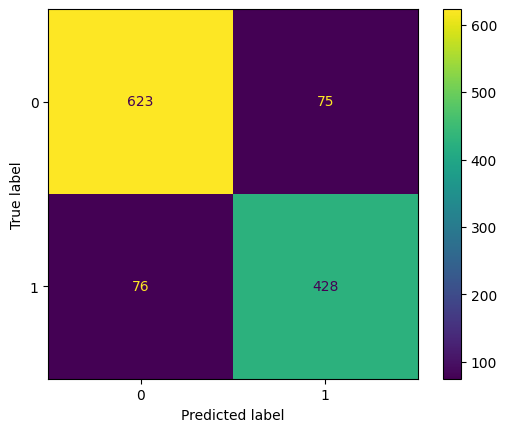

              precision    recall  f1-score   support

           0       0.89      0.89      0.89       698
           1       0.85      0.85      0.85       504

    accuracy                           0.87      1202
   macro avg       0.87      0.87      0.87      1202
weighted avg       0.87      0.87      0.87      1202


Métricas da avaliação de teste:
[[277  23]
 [ 45 171]]


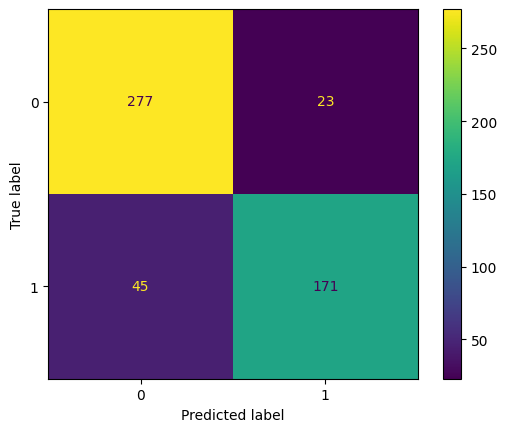

              precision    recall  f1-score   support

           0       0.86      0.92      0.89       300
           1       0.88      0.79      0.83       216

    accuracy                           0.87       516
   macro avg       0.87      0.86      0.86       516
weighted avg       0.87      0.87      0.87       516



In [ ]:
metricas_classificacao(grid_xgb)

## **Aprendizado não Supervisionado** - Segmentação dos dados

### Modelo KMeans



In [ ]:
df = pd.read_csv('/content/pistachio.csv')

In [ ]:
df['Class'] = df['Class'].replace({'Siit_Pistachio': 1, 'Kirmizi_Pistachio': 0})

In [ ]:
df['Class'].value_counts()

0    998
1    720
Name: Class, dtype: int64

Utilizaremos o método do cotovelo para tentar encontrar o melhor valor de 'k'

In [ ]:
k = range(1,10)

df_scaled = StandardScaler().fit_transform(df.drop(columns='Class'))
inercias = []
for k_ in k:
    kmeans = KMeans(n_clusters = k_)
    kmeans.fit(df_scaled)

    inercia = kmeans.inertia_
    inercias.append(inercia)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

Text(0.5, 1.0, 'Método do Cotovelo')

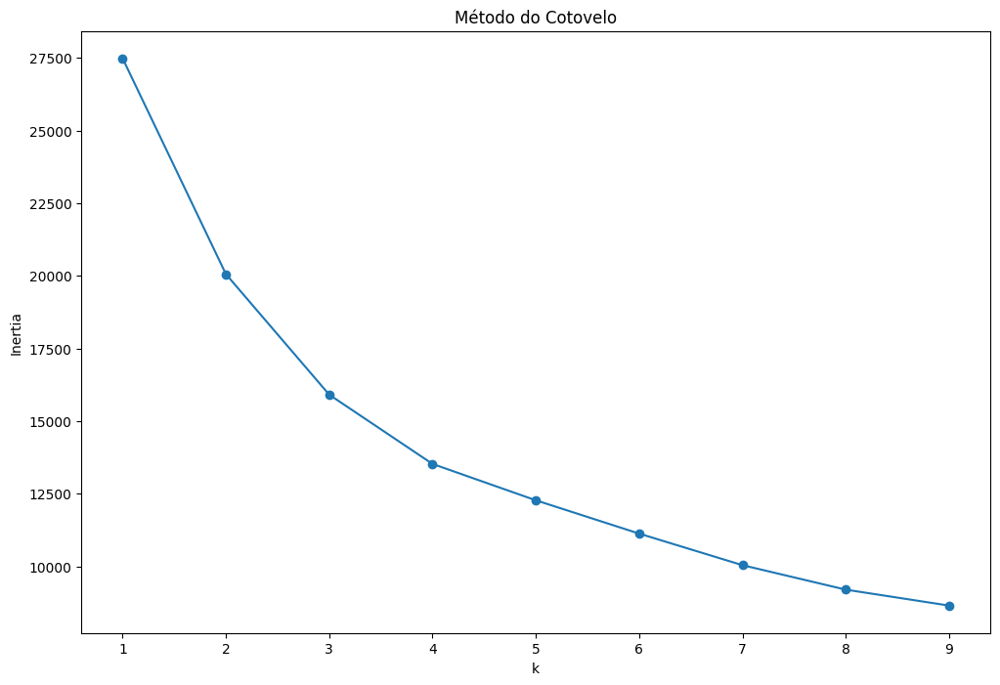

In [ ]:
plt.figure(figsize = (12, 8))
plt.plot(k, inercias, marker = 'o')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Método do Cotovelo')

Como não obtivemos clareza, utilizaremos também o método da silhueta para comparação

In [ ]:
k_values = range(2, 11)  # Valores de K de 2 a 10

silhouette_scores = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(df, labels)
    silhouette_scores.append(silhouette_avg)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

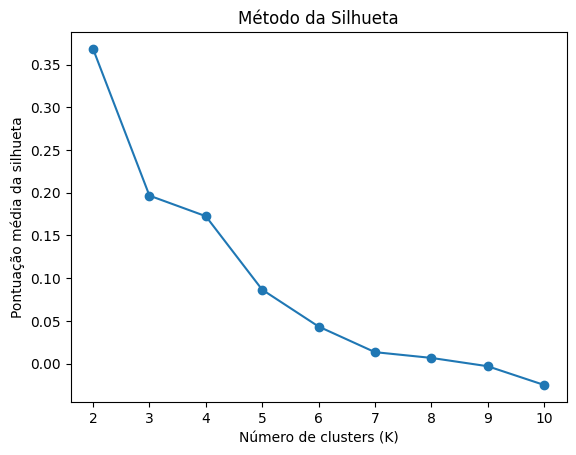

In [ ]:
#plotando os valores
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Número de clusters (K)')
plt.ylabel('Pontuação média da silhueta')
plt.title('Método da Silhueta')
plt.show()

O valor de K com a maior pontuação da silhueta média é considerado o melhor número de clusters

Em nosso caso, o maior valor foi para 'k = 2'

In [ ]:
kmeans = KMeans(n_clusters = 2, n_init='auto')
kmeans.fit(df_scaled)

KMeans(n_clusters=2, n_init='auto')

In [ ]:
kmeans.labels_

array([0, 1, 0, ..., 1, 0, 0], dtype=int32)

In [ ]:
df['cluster'] = kmeans.labels_

In [ ]:
df.columns

Index(['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
       'SHAPEFACTOR_3', 'SHAPEFACTOR_4', 'Class', 'cluster'],
      dtype='object')

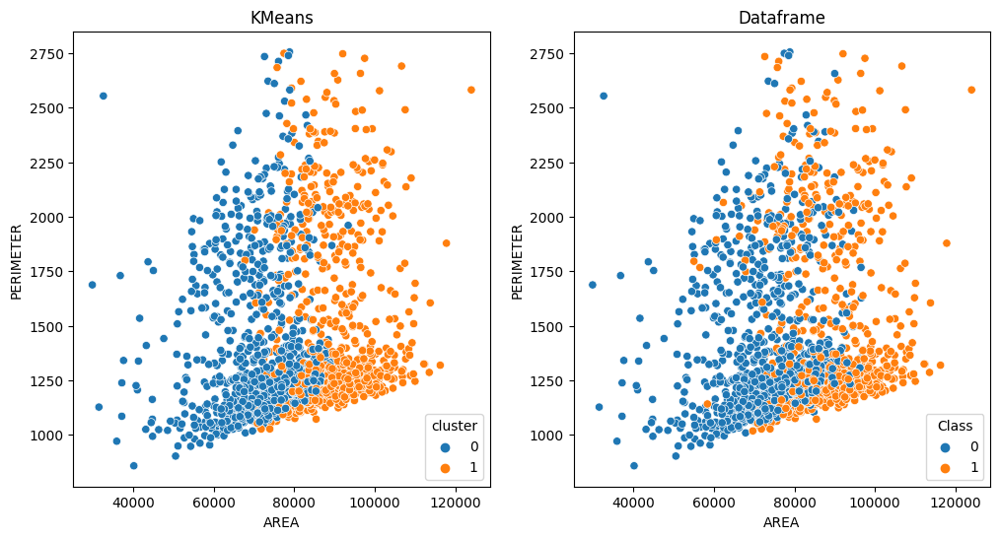

In [ ]:
#plotando os resultados

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Primeiro gráfico: scatterplot com 'cluster' como hue
sns.scatterplot(data=df, x = 'AREA', y='PERIMETER', hue='cluster', ax=axes[0])
axes[0].set_title('KMeans')

# Segundo gráfico: scatterplot com 'Class' como hue
sns.scatterplot(data=df, x='AREA', y='PERIMETER', hue='Class', ax=axes[1])
axes[1].set_title('Dataframe')

plt.show()

In [ ]:
df['Class'].value_counts()

0    998
1    720
Name: Class, dtype: int64

In [ ]:
df['cluster'].value_counts()

0    922
1    796
Name: cluster, dtype: int64

Analise individual dos clusters:

In [ ]:
df.query("cluster == 0").describe()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,Class,cluster
count,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.000000,922.0
mean,71329.806941,1379.219342,439.488416,217.707485,0.865395,300.602153,0.930967,76666.896963,0.705539,2.033141,0.539946,0.684886,0.006241,0.003089,0.470017,0.948456,0.099783,0.0
std,9680.238541,350.152391,33.573869,20.864966,0.033672,21.419003,0.053088,10005.229503,0.057407,0.207972,0.196987,0.030828,0.000705,0.000366,0.041508,0.054792,0.299873,0.0
min,29808.000000,858.363000,321.425500,133.509600,0.624900,194.814600,0.588000,37935.000000,0.427200,1.281000,0.062800,0.476000,0.005500,0.002400,0.226600,0.620400,0.000000,0.0
25%,66023.000000,1139.420825,419.228575,207.706950,0.852325,289.936375,0.910025,70958.250000,0.675450,1.911875,0.354375,0.668075,0.005800,0.002900,0.446375,0.940025,0.000000,0.0
50%,72607.500000,1238.885000,441.318450,218.984250,0.871800,304.050550,0.945400,77639.500000,0.716100,2.041400,0.603800,0.684800,0.006100,0.003000,0.469000,0.966700,0.000000,0.0
75%,78188.000000,1538.082500,462.180050,228.974750,0.885675,315.518700,0.968875,83217.250000,0.748200,2.153500,0.701175,0.704350,0.006400,0.003200,0.496150,0.981100,0.000000,0.0
max,93406.000000,2755.049100,525.728900,306.216700,0.946000,344.859700,0.992100,104720.000000,0.820400,3.085800,0.843800,0.785400,0.013100,0.005300,0.616800,0.998300,1.000000,0.0


In [ ]:
df.query("cluster == 1").describe()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,Class,cluster
count,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.000000,796.0
mean,89766.247487,1471.115607,453.987878,261.921474,0.811334,337.698537,0.950684,94539.221106,0.728235,1.744363,0.606605,0.745221,0.005082,0.002934,0.556521,0.962980,0.788945,1.0
std,8485.942405,393.149029,27.873570,21.086431,0.048032,15.935901,0.043895,9054.991468,0.043196,0.175459,0.221996,0.034176,0.000344,0.000271,0.051595,0.046788,0.408314,0.0
min,67535.000000,1026.913900,351.684600,231.140600,0.504900,293.237500,0.718000,70101.000000,0.503500,1.158500,0.128800,0.673500,0.004000,0.002500,0.453600,0.682900,0.000000,1.0
25%,83919.500000,1201.556250,434.419200,245.397225,0.790050,326.878600,0.930875,88273.750000,0.704800,1.631200,0.409475,0.723175,0.004800,0.002800,0.522975,0.951050,1.000000,1.0
50%,89753.500000,1280.544600,456.249700,257.864950,0.820050,338.049850,0.962500,93912.000000,0.738050,1.747450,0.703650,0.742350,0.005100,0.002900,0.551150,0.980550,1.000000,1.0
75%,95066.500000,1661.435925,473.482450,273.976650,0.843500,347.911525,0.984800,100040.750000,0.759025,1.861575,0.784250,0.764025,0.005400,0.003100,0.583750,0.992425,1.000000,1.0
max,124008.000000,2748.856900,535.642200,383.046100,0.887700,397.356100,0.995100,132478.000000,0.812300,2.171700,0.933600,0.869500,0.006000,0.004400,0.756100,0.999000,1.000000,1.0


Como temos os valores originais de classificação dos pistaches, podemos calcular o desempenho do modelo de segmentação:

In [ ]:
# Calcula a porcentagem de acerto
percentual_acerto = (df['cluster'] == df['Class']).mean() * 100
print(f'Percentual de acerto: {percentual_acerto:.2f}%')

Percentual de acerto: 84.87%


## Modelo Dbscan

In [ ]:
data = pd.read_csv('/content/pistachio.csv')

Utilizamos inicialmente os valores padrão do modelo

In [ ]:
df = data.drop(columns=['Class'])
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df)

# Crie o modelo DBSCAN
eps = 0.5  # valores default
min_samples = 5
dbscan = DBSCAN(eps=eps, min_samples=min_samples)

# Ajuste o modelo aos dados
dbscan.fit(df_scaled)


DBSCAN()

In [ ]:
# Acesse as labels dos clusters
labels = dbscan.labels_

# Verifica o número de clusters encontrados e os pontos de ruído
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

In [ ]:
labels

array([-1, -1, -1, ..., -1, -1, -1])

In [ ]:
n_clusters

7

In [ ]:
n_noise

1626

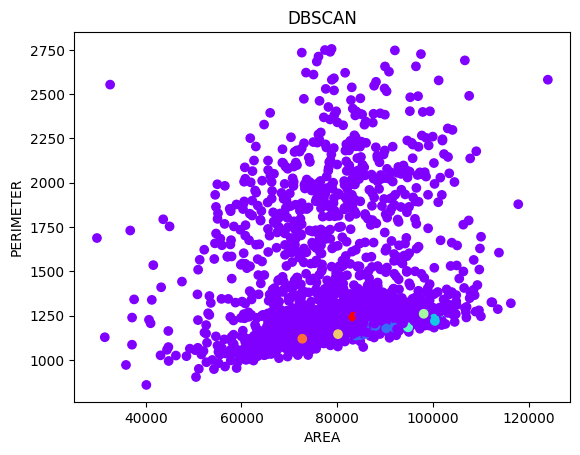

In [ ]:
#df = pd.DataFrame(data_scaled, columns=data.columns)
df['Cluster_DB'] = labels

# Plotar os clusters usando scatter plot
plt.scatter(df['AREA'], df['PERIMETER'], c=df['Cluster_DB'], cmap='rainbow')
plt.xlabel('AREA')
plt.ylabel('PERIMETER')
plt.title('DBSCAN')
plt.show()

Otimizando os valores de 'eps' e 'min_samples' para abrangencia das informações

In [ ]:
def plot_dbscan(df, eps, min_samples):
    # modelo
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df)
    dbscan = DBSCAN(eps = eps, min_samples = min_samples)
    dbscan.fit(df_scaled)

    # estruturação dos resultados
    labels_clusters = dbscan.labels_
    labels_series = pd.Series(labels_clusters, name="label")

    df_result = pd.concat([df, labels_series], axis=1)
    n_clusters = pd.Series(labels_clusters).nunique()

    # ========================================
    print(f"DBSCAN com eps={eps} e minPts={min_samples}\nNúmero de clusters: {n_clusters}")
    sns.scatterplot(data=df_result, x="AREA", y="PERIMETER", hue="label", palette='rocket')
    plt.show()

    print("Quantidade de pontos em cada clusters:")
    print(pd.Series(labels_clusters).value_counts())

    return df_result, n_clusters

DBSCAN com eps=0.5 e minPts=5
Número de clusters: 8


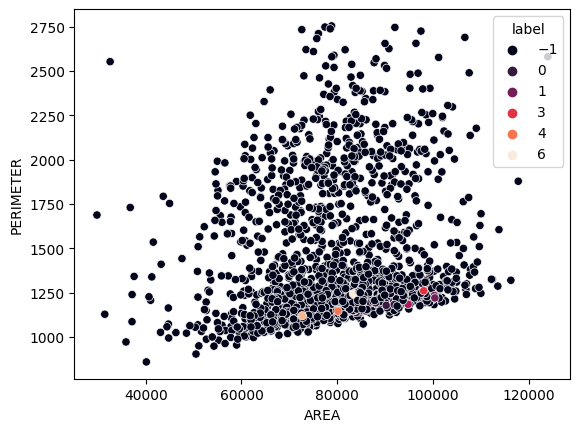

Quantidade de pontos em cada clusters:
-1    1626
 0      49
 1      11
 4       9
 2       8
 3       5
 6       5
 5       5
dtype: int64


In [ ]:
df_result, n_clusters = plot_dbscan(df = df,
                                   eps = 0.5,
                                   min_samples= 5)

In [ ]:

def result_dbscan(df, eps, min_samples):
    # modelo
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df)
    dbscan = DBSCAN(eps = eps, min_samples = min_samples)
    dbscan.fit(df_scaled)

    # estruturação dos resultados
    labels_clusters = dbscan.labels_
    labels_series = pd.Series(labels_clusters, name="label")

    df_result = pd.concat([df, labels_series], axis=1)
    n_clusters = pd.Series(labels_clusters).nunique()

    # ========================================
    print(f"DBSCAN com eps={eps} e minPts={min_samples}\nNúmero de clusters: {n_clusters}")


    return df_result, n_clusters

DBSCAN com eps=0.1 e minPts=5
Número de clusters: 1


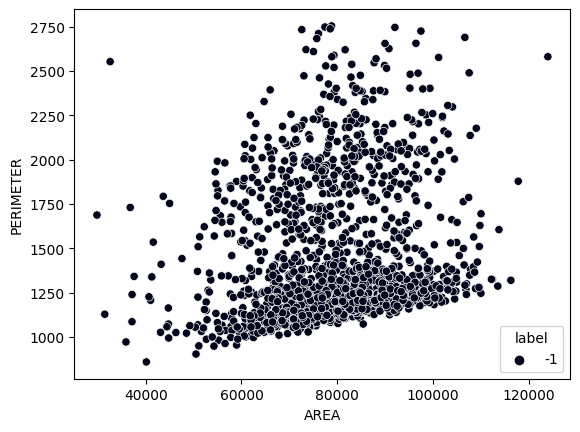

Quantidade de pontos em cada clusters:
-1    1718
dtype: int64
DBSCAN com eps=0.15000000000000002 e minPts=5
Número de clusters: 1


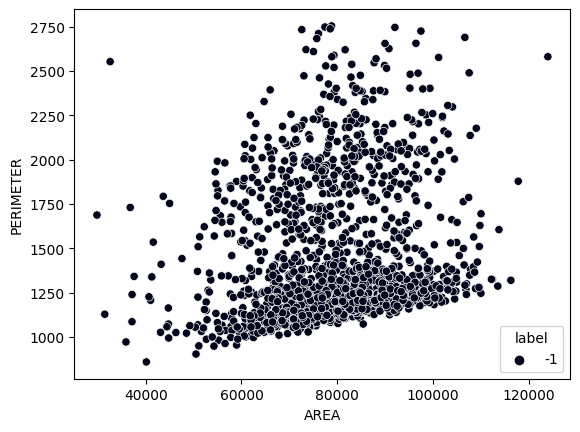

Quantidade de pontos em cada clusters:
-1    1718
dtype: int64
DBSCAN com eps=0.20000000000000004 e minPts=5
Número de clusters: 1


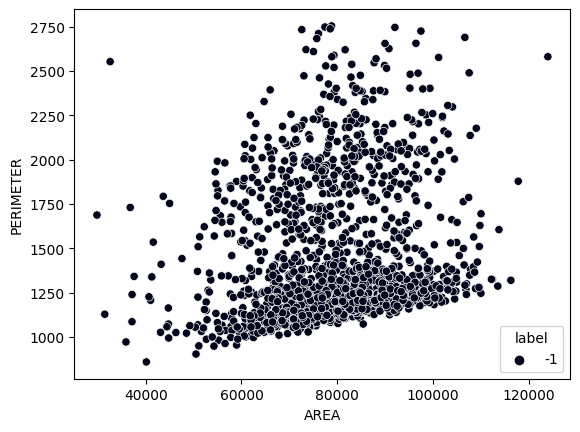

Quantidade de pontos em cada clusters:
-1    1718
dtype: int64
DBSCAN com eps=0.25000000000000006 e minPts=5
Número de clusters: 1


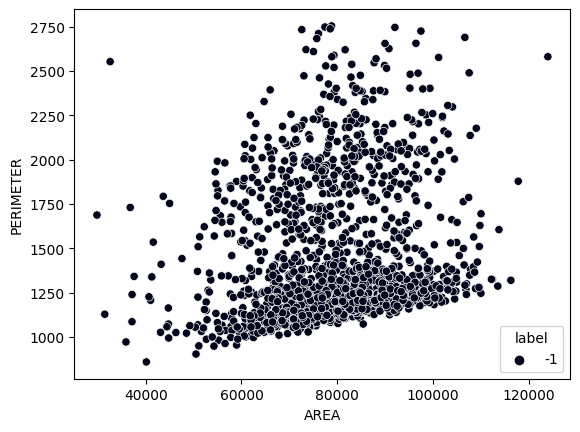

Quantidade de pontos em cada clusters:
-1    1718
dtype: int64
DBSCAN com eps=0.30000000000000004 e minPts=5
Número de clusters: 1


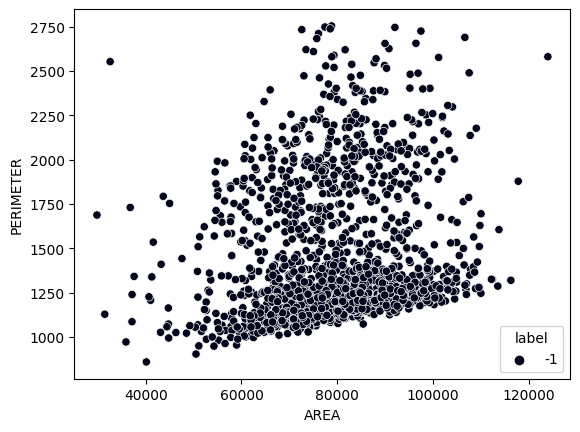

Quantidade de pontos em cada clusters:
-1    1718
dtype: int64
DBSCAN com eps=0.3500000000000001 e minPts=5
Número de clusters: 1


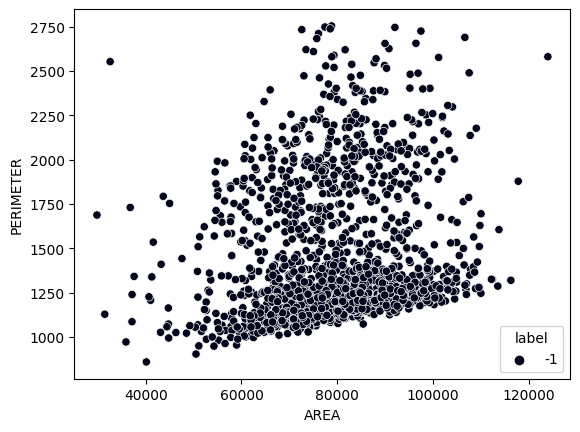

Quantidade de pontos em cada clusters:
-1    1718
dtype: int64
DBSCAN com eps=0.40000000000000013 e minPts=5
Número de clusters: 4


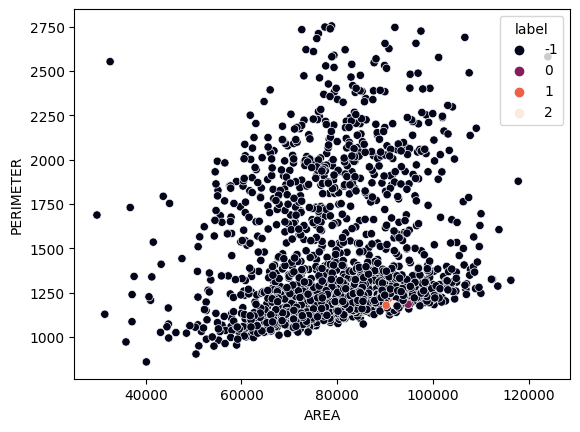

Quantidade de pontos em cada clusters:
-1    1703
 2       5
 0       5
 1       5
dtype: int64
DBSCAN com eps=0.45000000000000007 e minPts=5
Número de clusters: 5


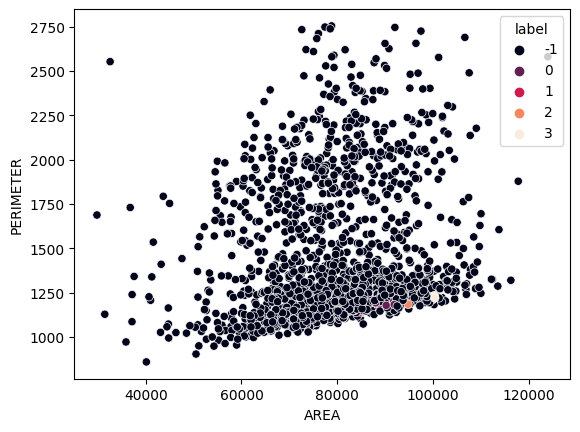

Quantidade de pontos em cada clusters:
-1    1677
 0      22
 1       7
 2       6
 3       6
dtype: int64
DBSCAN com eps=0.5000000000000001 e minPts=5
Número de clusters: 8


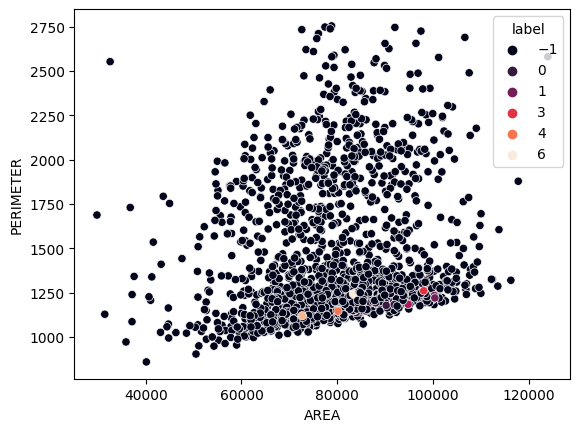

Quantidade de pontos em cada clusters:
-1    1626
 0      49
 1      11
 4       9
 2       8
 3       5
 6       5
 5       5
dtype: int64
DBSCAN com eps=0.5500000000000002 e minPts=5
Número de clusters: 25


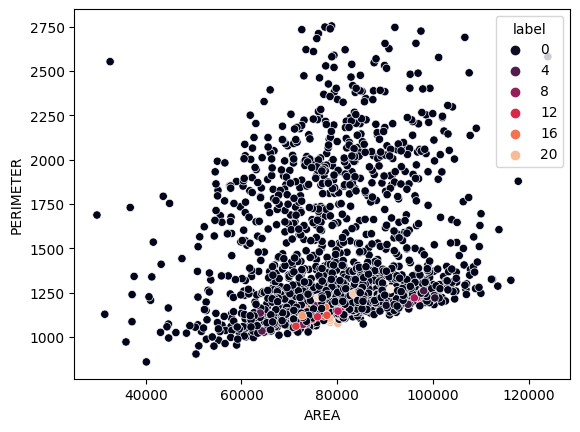

Quantidade de pontos em cada clusters:
-1     1516
 0       49
 1       11
 11      11
 4       10
 10       9
 6        9
 2        8
 5        7
 13       7
 20       7
 8        7
 12       6
 22       6
 17       5
 21       5
 23       5
 3        5
 7        5
 16       5
 19       5
 9        5
 14       5
 18       5
 15       5
dtype: int64
DBSCAN com eps=0.6000000000000002 e minPts=5
Número de clusters: 25


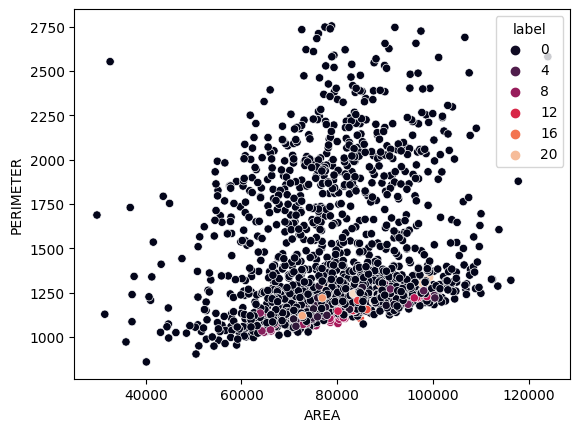

Quantidade de pontos em cada clusters:
-1     1422
 2       62
 0       49
 1       40
 7       13
 9       13
 3       11
 8       10
 11       9
 6        8
 14       8
 17       8
 13       6
 5        6
 10       6
 15       5
 19       5
 16       5
 22       5
 21       5
 4        5
 20       5
 23       4
 12       4
 18       4
dtype: int64
DBSCAN com eps=0.6500000000000001 e minPts=5
Número de clusters: 21


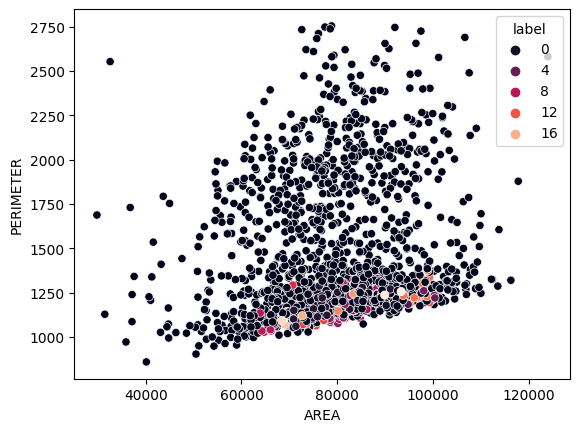

Quantidade de pontos em cada clusters:
-1     1313
 1      177
 0       49
 6       31
 2       21
 8       16
 7       15
 13      14
 11      11
 4       11
 14       9
 3        8
 9        7
 12       5
 15       5
 10       5
 5        5
 16       5
 17       4
 18       4
 19       3
dtype: int64
DBSCAN com eps=0.7000000000000002 e minPts=5
Número de clusters: 20


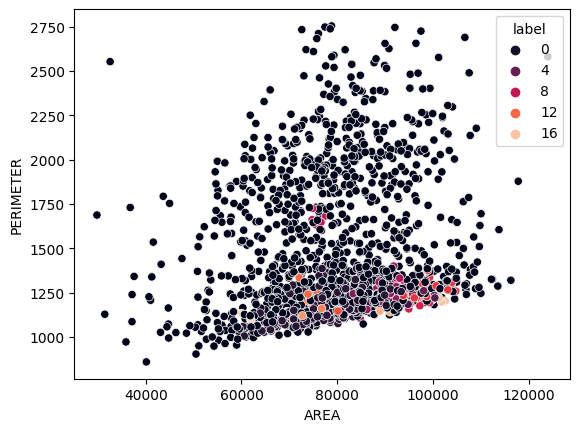

Quantidade de pontos em cada clusters:
-1     1165
 1      352
 0       49
 6       35
 10      20
 3       11
 11       9
 13       9
 9        8
 7        8
 2        8
 15       6
 8        5
 5        5
 4        5
 16       5
 12       5
 14       5
 18       4
 17       4
dtype: int64
DBSCAN com eps=0.7500000000000002 e minPts=5
Número de clusters: 19


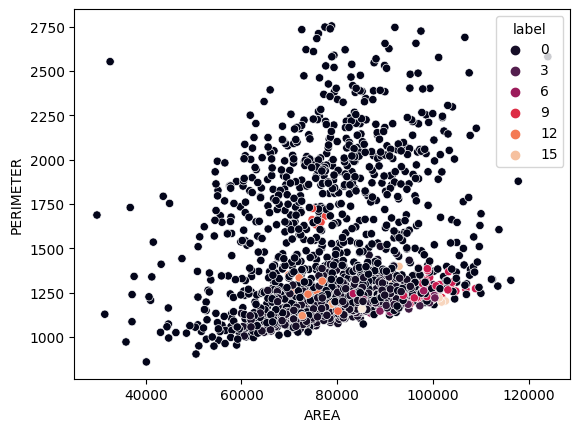

Quantidade de pontos em cada clusters:
-1     1048
 0      490
 1       49
 8       31
 2       12
 4       11
 5       11
 12       9
 11       9
 3        8
 6        5
 9        5
 13       5
 7        5
 10       5
 16       5
 14       4
 17       3
 15       3
dtype: int64
DBSCAN com eps=0.8000000000000002 e minPts=5
Número de clusters: 16


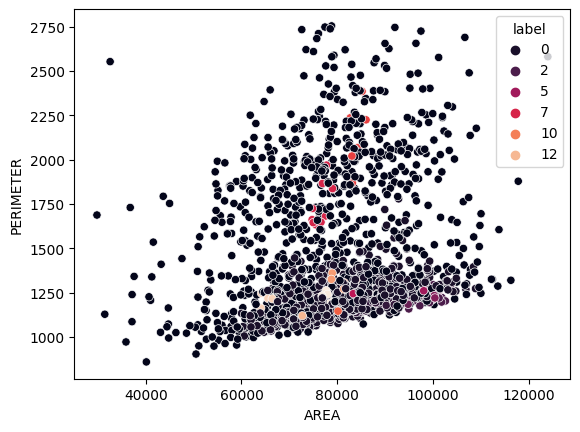

Quantidade de pontos em cada clusters:
-1     923
 0     639
 1      49
 2      25
 4      11
 7      10
 9       9
 3       8
 8       7
 14      7
 5       5
 6       5
 13      5
 10      5
 11      5
 12      5
dtype: int64
DBSCAN com eps=0.8500000000000002 e minPts=5
Número de clusters: 14


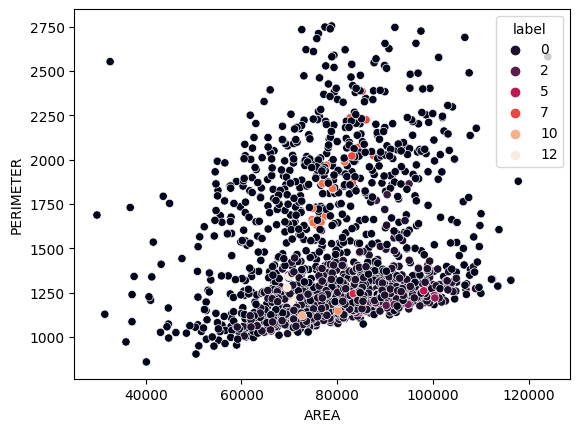

Quantidade de pontos em cada clusters:
-1     850
 0     744
 2      49
 4      11
 8      11
 9       9
 3       8
 7       8
 1       5
 5       5
 6       5
 12      5
 10      5
 11      3
dtype: int64
DBSCAN com eps=0.9000000000000002 e minPts=5
Número de clusters: 19


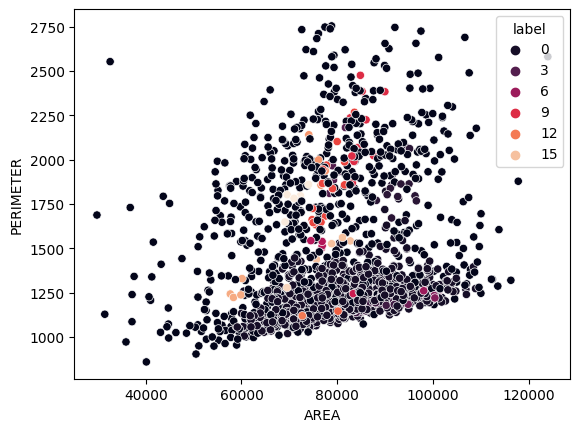

Quantidade de pontos em cada clusters:
 0     812
-1     744
 2      49
 10     15
 1      13
 5      11
 9      11
 11      9
 4       8
 13      6
 17      5
 8       5
 7       5
 6       5
 3       5
 12      5
 14      4
 15      4
 16      2
dtype: int64
DBSCAN com eps=0.9500000000000003 e minPts=5
Número de clusters: 19


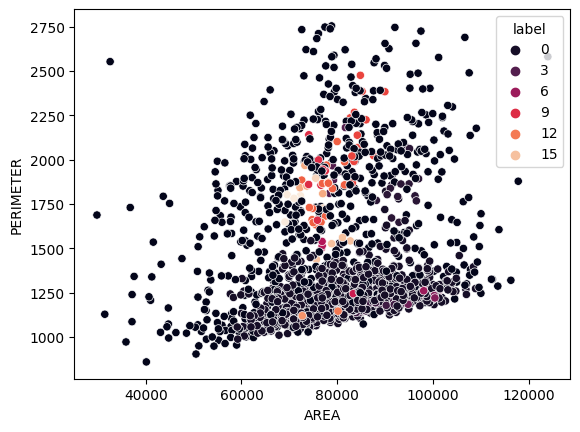

Quantidade de pontos em cada clusters:
 0     864
-1     682
 2      49
 11     16
 1      15
 10     14
 5      11
 9       9
 12      9
 4       8
 14      5
 8       5
 6       5
 3       5
 13      5
 15      4
 16      4
 7       4
 17      4
dtype: int64
DBSCAN com eps=1.0000000000000004 e minPts=5
Número de clusters: 15


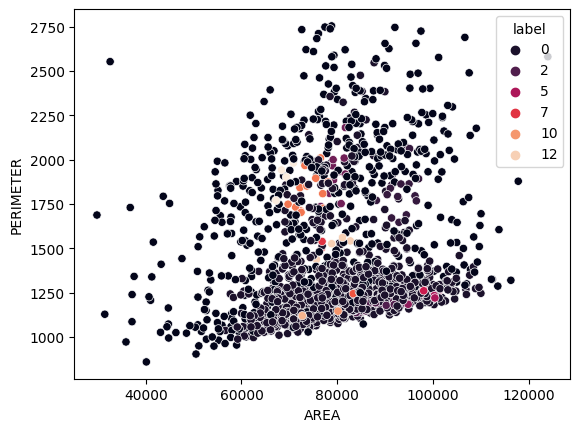

Quantidade de pontos em cada clusters:
 0     970
-1     603
 2      49
 1      16
 9      14
 5      11
 3      10
 10      9
 4       8
 13      6
 6       5
 8       5
 11      5
 12      4
 7       3
dtype: int64
DBSCAN com eps=1.0500000000000003 e minPts=5
Número de clusters: 13


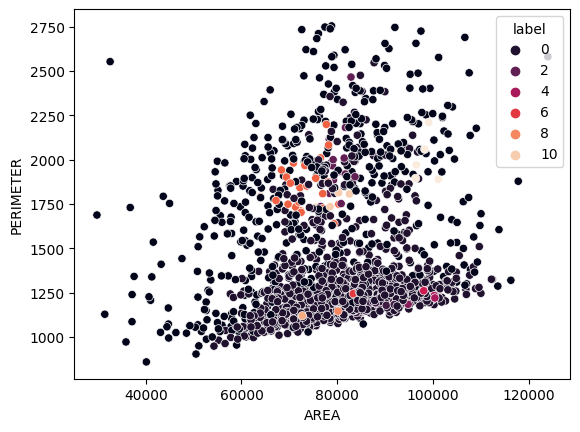

Quantidade de pontos em cada clusters:
 0     1044
-1      532
 1       49
 7       26
 2       14
 4       11
 8        9
 3        8
 11       6
 5        5
 6        5
 9        5
 10       4
dtype: int64
DBSCAN com eps=1.1000000000000005 e minPts=5
Número de clusters: 12


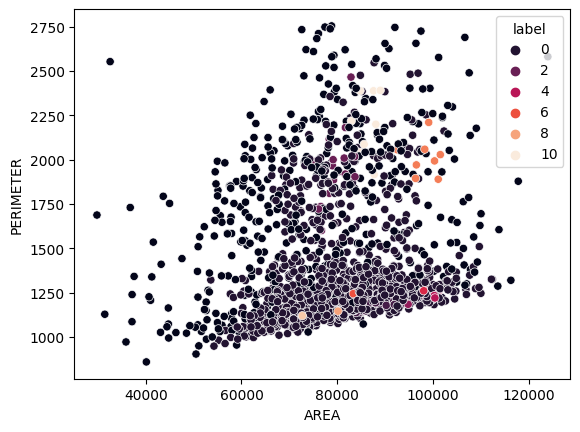

Quantidade de pontos em cada clusters:
 0     1122
-1      471
 1       49
 2       17
 4       11
 8        9
 3        8
 10       8
 7        8
 5        5
 6        5
 9        5
dtype: int64
DBSCAN com eps=1.1500000000000004 e minPts=5
Número de clusters: 10


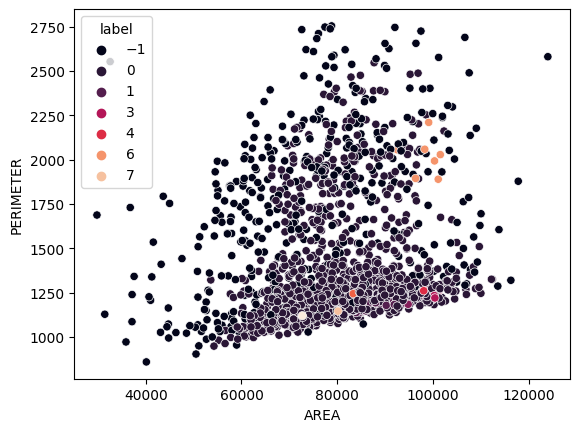

Quantidade de pontos em cada clusters:
 0    1198
-1     421
 1      49
 3      11
 7       9
 2       8
 6       7
 4       5
 5       5
 8       5
dtype: int64
DBSCAN com eps=1.2000000000000004 e minPts=5
Número de clusters: 10


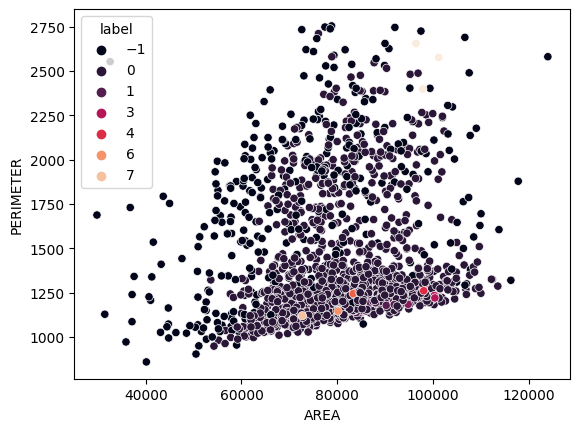

Quantidade de pontos em cada clusters:
 0    1261
-1     362
 1      49
 3      11
 6       9
 2       8
 4       5
 5       5
 7       5
 8       3
dtype: int64
DBSCAN com eps=1.2500000000000004 e minPts=5
Número de clusters: 11


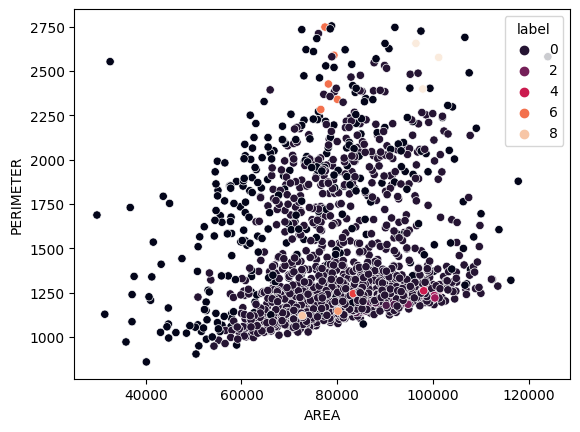

Quantidade de pontos em cada clusters:
 0    1307
-1     311
 1      49
 3      11
 7       9
 2       8
 4       5
 5       5
 6       5
 8       5
 9       3
dtype: int64
DBSCAN com eps=1.3000000000000005 e minPts=5
Número de clusters: 12


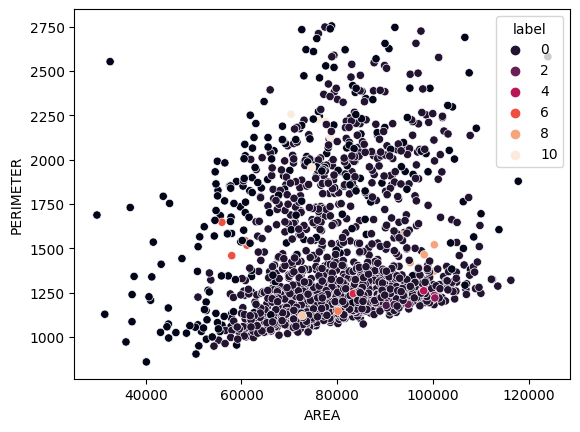

Quantidade de pontos em cada clusters:
 0     1357
-1      255
 1       49
 3       11
 7        9
 2        8
 8        5
 4        5
 5        5
 10       5
 9        5
 6        4
dtype: int64
DBSCAN com eps=1.3500000000000005 e minPts=5
Número de clusters: 12


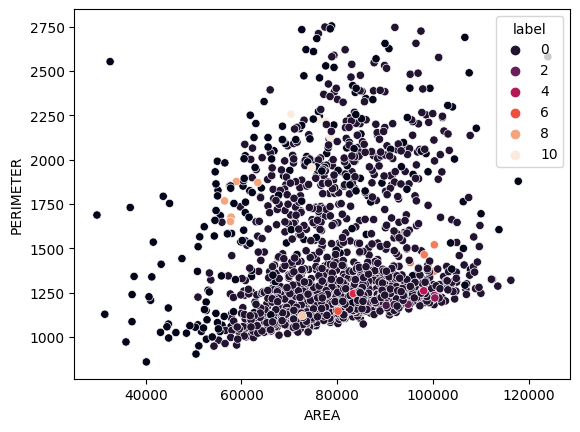

Quantidade de pontos em cada clusters:
 0     1389
-1      222
 1       49
 3       11
 6        9
 2        8
 7        5
 4        5
 5        5
 10       5
 8        5
 9        5
dtype: int64
DBSCAN com eps=1.4000000000000006 e minPts=5
Número de clusters: 13


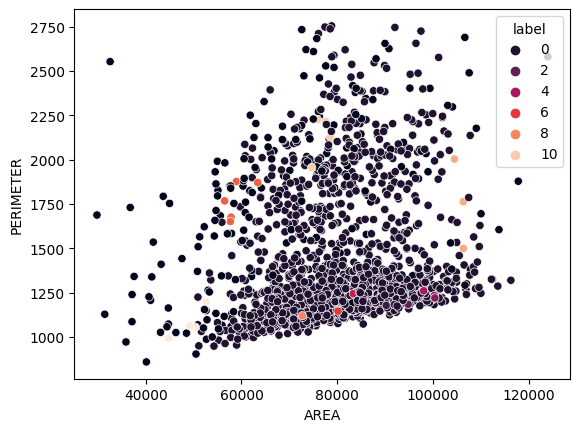

Quantidade de pontos em cada clusters:
 0     1421
-1      189
 1       49
 3       11
 6        9
 2        8
 4        5
 5        5
 7        5
 8        5
 10       4
 11       4
 9        3
dtype: int64
DBSCAN com eps=1.4500000000000006 e minPts=5
Número de clusters: 12


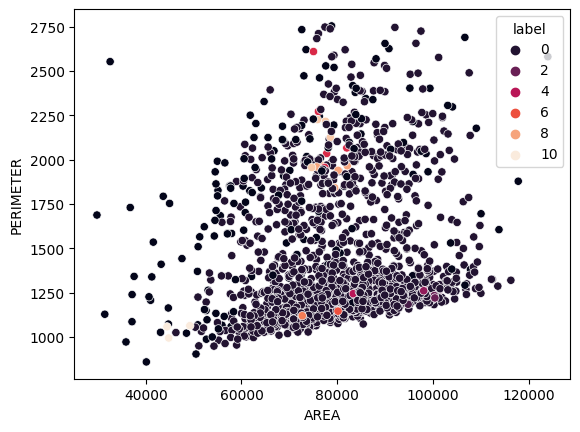

Quantidade de pontos em cada clusters:
 0     1498
-1      159
 2       11
 6        9
 1        8
 5        6
 3        5
 4        5
 8        5
 7        5
 9        4
 10       3
dtype: int64
DBSCAN com eps=1.5000000000000004 e minPts=5
Número de clusters: 9


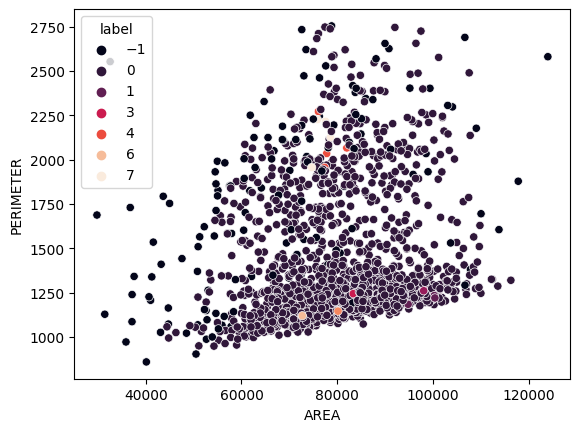

Quantidade de pontos em cada clusters:
 0    1526
-1     140
 1      19
 5       9
 4       5
 2       5
 3       5
 6       5
 7       4
dtype: int64
DBSCAN com eps=1.5500000000000005 e minPts=5
Número de clusters: 9


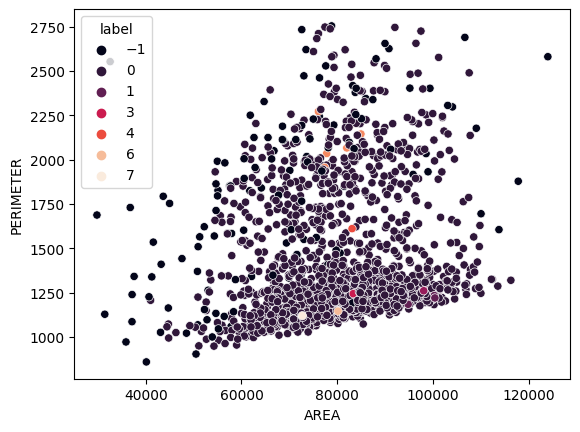

Quantidade de pontos em cada clusters:
 0    1541
-1     125
 1      19
 6       9
 5       6
 2       5
 3       5
 7       5
 4       3
dtype: int64
DBSCAN com eps=1.6000000000000005 e minPts=5
Número de clusters: 7


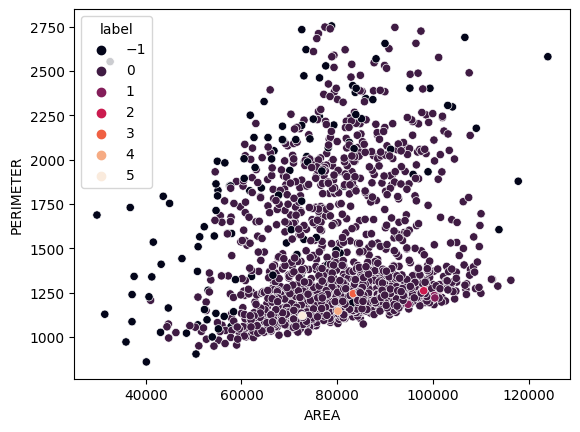

Quantidade de pontos em cada clusters:
 0    1555
-1     120
 1      19
 4       9
 2       5
 3       5
 5       5
dtype: int64
DBSCAN com eps=1.6500000000000006 e minPts=5
Número de clusters: 6


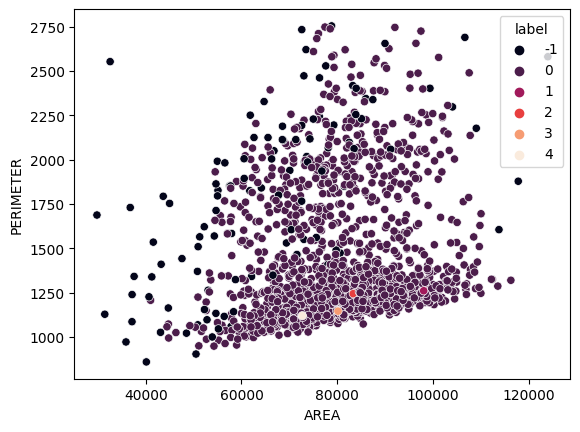

Quantidade de pontos em cada clusters:
 0    1583
-1     111
 3       9
 1       5
 2       5
 4       5
dtype: int64
DBSCAN com eps=1.7000000000000006 e minPts=5
Número de clusters: 7


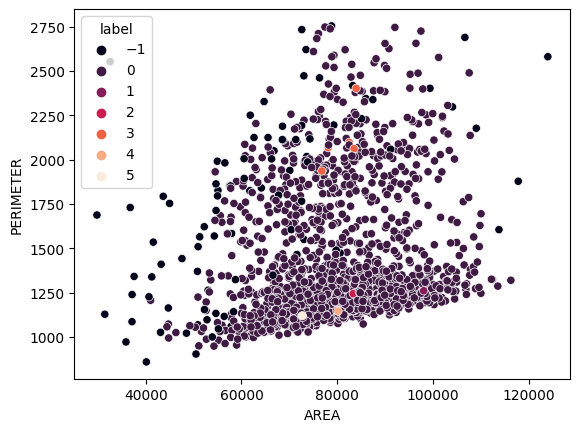

Quantidade de pontos em cada clusters:
 0    1592
-1      97
 4       9
 1       5
 2       5
 3       5
 5       5
dtype: int64
DBSCAN com eps=1.7500000000000007 e minPts=5
Número de clusters: 7


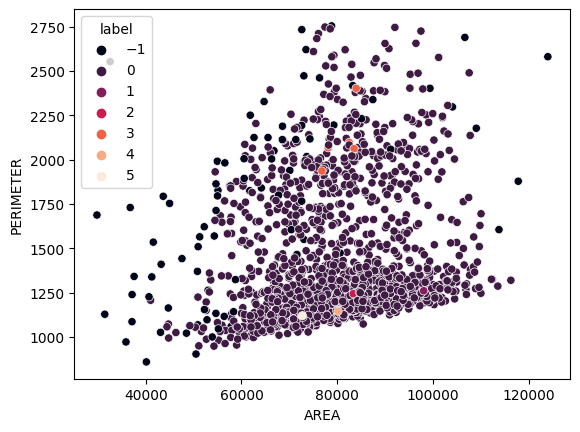

Quantidade de pontos em cada clusters:
 0    1600
-1      89
 4       9
 1       5
 2       5
 3       5
 5       5
dtype: int64
DBSCAN com eps=1.8000000000000007 e minPts=5
Número de clusters: 7


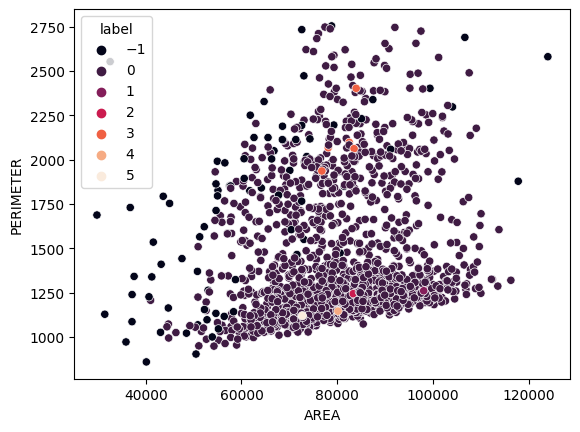

Quantidade de pontos em cada clusters:
 0    1608
-1      81
 4       9
 1       5
 2       5
 3       5
 5       5
dtype: int64
DBSCAN com eps=1.8500000000000008 e minPts=5
Número de clusters: 7


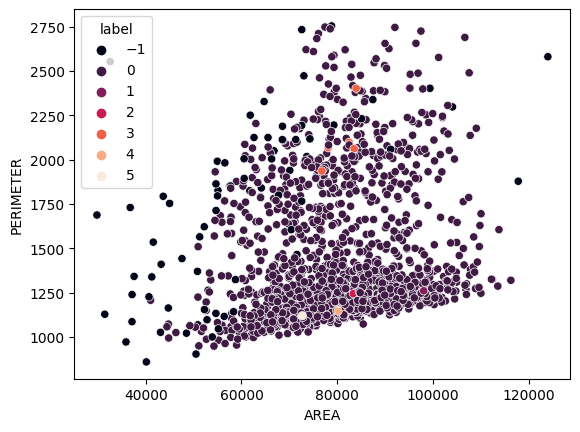

Quantidade de pontos em cada clusters:
 0    1614
-1      75
 4       9
 1       5
 2       5
 3       5
 5       5
dtype: int64
DBSCAN com eps=1.9000000000000008 e minPts=5
Número de clusters: 7


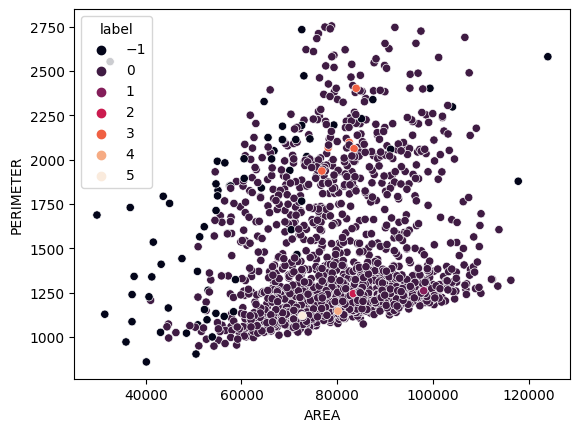

Quantidade de pontos em cada clusters:
 0    1620
-1      69
 4       9
 1       5
 2       5
 3       5
 5       5
dtype: int64
DBSCAN com eps=1.9500000000000006 e minPts=5
Número de clusters: 7


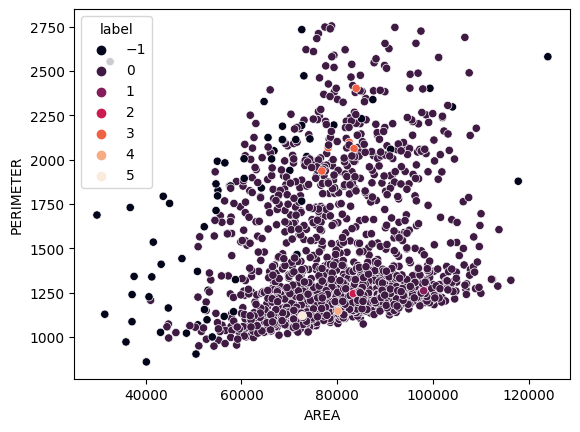

Quantidade de pontos em cada clusters:
 0    1624
-1      65
 4       9
 1       5
 2       5
 3       5
 5       5
dtype: int64


In [ ]:
# variando o eps
eps_values = np.arange(0.1, 2.0, 0.05)
n_clusters = []

for eps in eps_values:
    _, n = plot_dbscan(df, eps = eps, min_samples= 5)
    n_clusters.append(n)

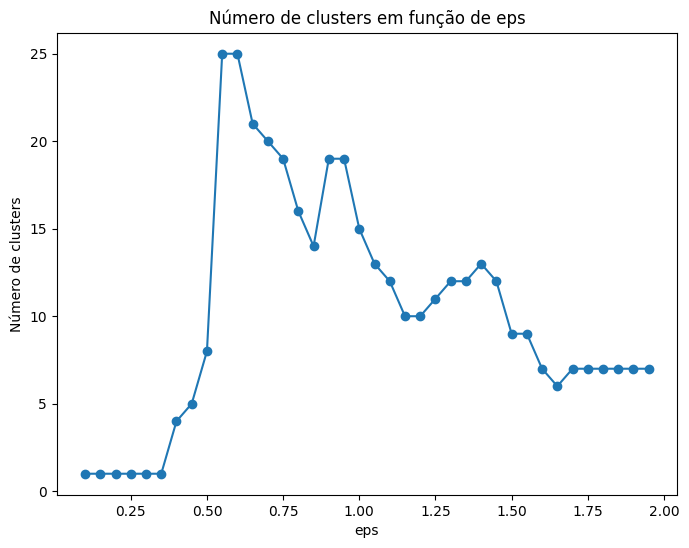

In [ ]:
plt.figure(figsize = (8,6))
plt.plot(eps_values, n_clusters, marker = 'o')
plt.title('Número de clusters em função de eps')
plt.ylabel('Número de clusters')
plt.xlabel('eps')
plt.show()

DBSCAN com eps=0.5 e minPts=2
Número de clusters: 126


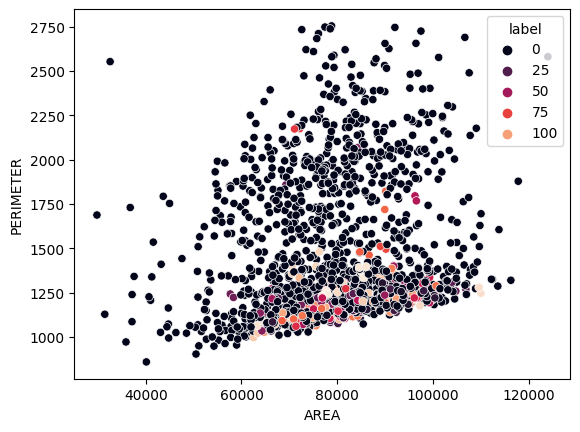

Quantidade de pontos em cada clusters:
-1     1287
 2       49
 13      11
 49      11
 43      10
       ... 
 72       2
 71       2
 70       2
 22       2
 84       2
Length: 126, dtype: int64
DBSCAN com eps=0.5 e minPts=3
Número de clusters: 52


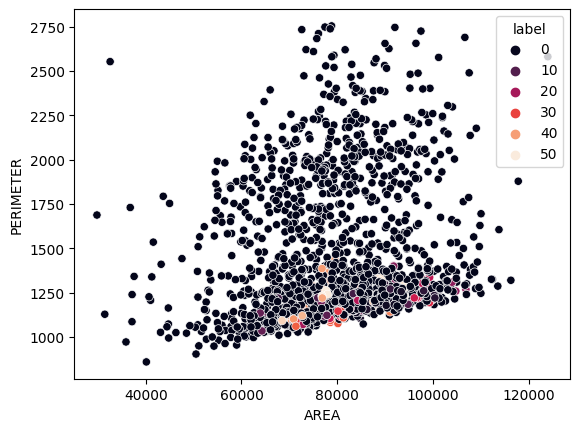

Quantidade de pontos em cada clusters:
-1     1435
 1       49
 18      11
 4       11
 31      10
 28       9
 10       8
 9        8
 15       7
 11       6
 41       6
 12       6
 39       6
 25       5
 23       5
 35       5
 43       5
 14       5
 33       5
 26       5
 8        5
 6        5
 32       5
 30       5
 5        5
 47       4
 49       4
 2        4
 45       4
 22       4
 38       3
 29       3
 34       3
 36       3
 48       3
 46       3
 37       3
 44       3
 0        3
 24       3
 27       3
 21       3
 20       3
 19       3
 16       3
 42       3
 17       3
 13       3
 7        3
 3        3
 40       3
 50       3
dtype: int64
DBSCAN com eps=0.5 e minPts=4
Número de clusters: 22


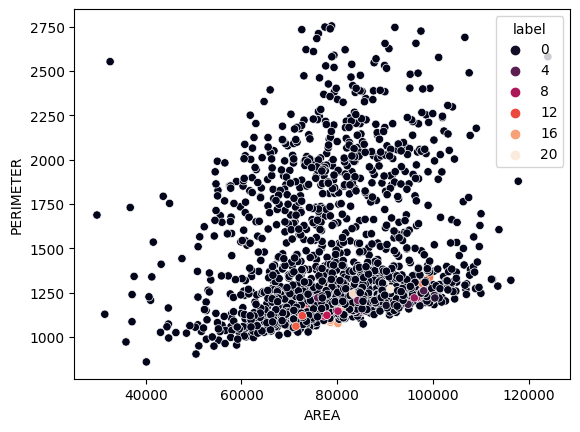

Quantidade de pontos em cada clusters:
-1     1563
 0       49
 1       11
 8        9
 2        8
 4        7
 6        7
 12       5
 7        5
 17       5
 19       5
 3        5
 10       4
 20       4
 5        4
 14       4
 16       4
 11       4
 9        4
 13       4
 15       4
 18       3
dtype: int64
DBSCAN com eps=0.5 e minPts=5
Número de clusters: 8


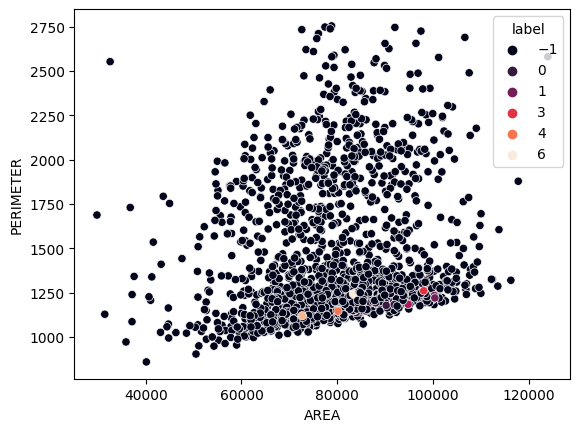

Quantidade de pontos em cada clusters:
-1    1626
 0      49
 1      11
 4       9
 2       8
 3       5
 6       5
 5       5
dtype: int64
DBSCAN com eps=0.5 e minPts=6
Número de clusters: 6


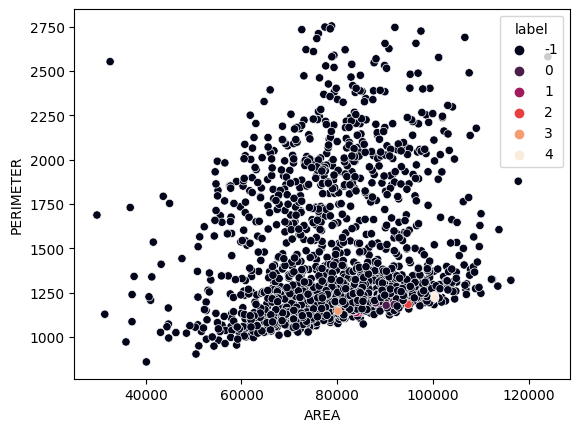

Quantidade de pontos em cada clusters:
-1    1656
 0      24
 1      14
 2       8
 4       8
 3       8
dtype: int64
DBSCAN com eps=0.5 e minPts=7
Número de clusters: 6


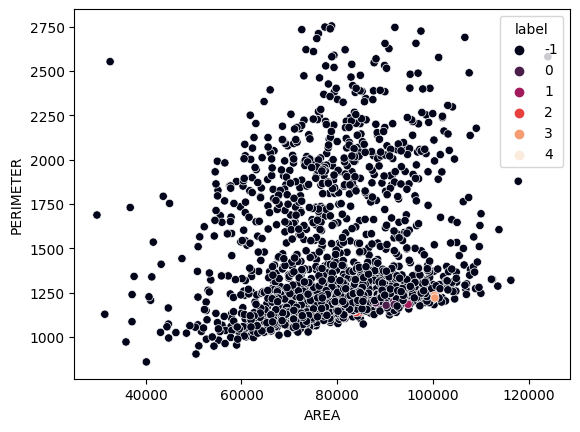

Quantidade de pontos em cada clusters:
-1    1668
 0      23
 3       8
 1       7
 2       7
 4       5
dtype: int64
DBSCAN com eps=0.5 e minPts=8
Número de clusters: 4


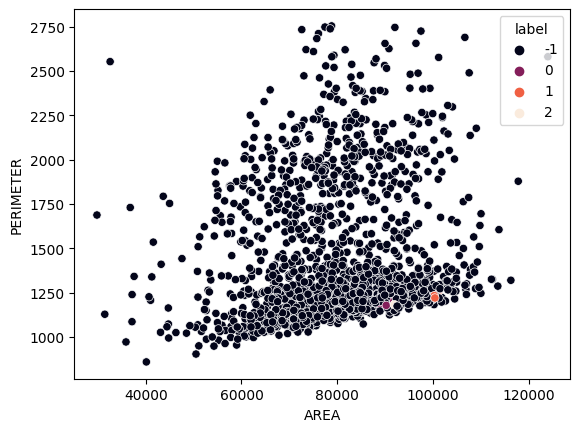

Quantidade de pontos em cada clusters:
-1    1693
 2       9
 1       8
 0       8
dtype: int64
DBSCAN com eps=0.5 e minPts=9
Número de clusters: 2


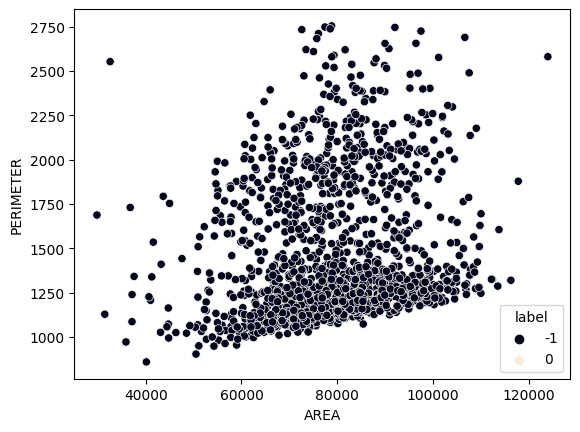

Quantidade de pontos em cada clusters:
-1    1708
 0      10
dtype: int64
DBSCAN com eps=0.5 e minPts=10
Número de clusters: 2


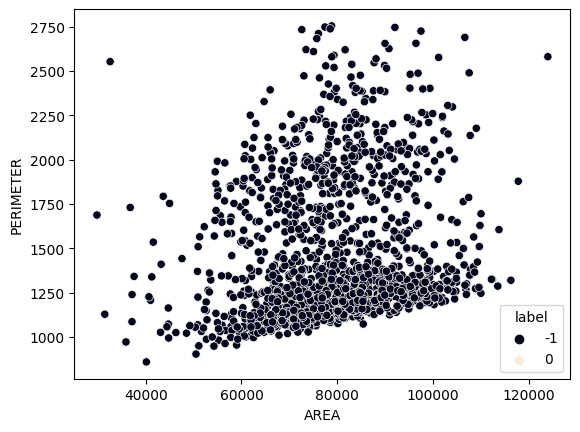

Quantidade de pontos em cada clusters:
-1    1708
 0      10
dtype: int64


In [ ]:
# variando o min_samples
minPts_values = range(2,11)
n_clusters = []

for minPts in minPts_values:
    _, n = plot_dbscan(df, eps = 0.5, min_samples= minPts)
    n_clusters.append(n)

Text(0.5, 0, '$minPts$')

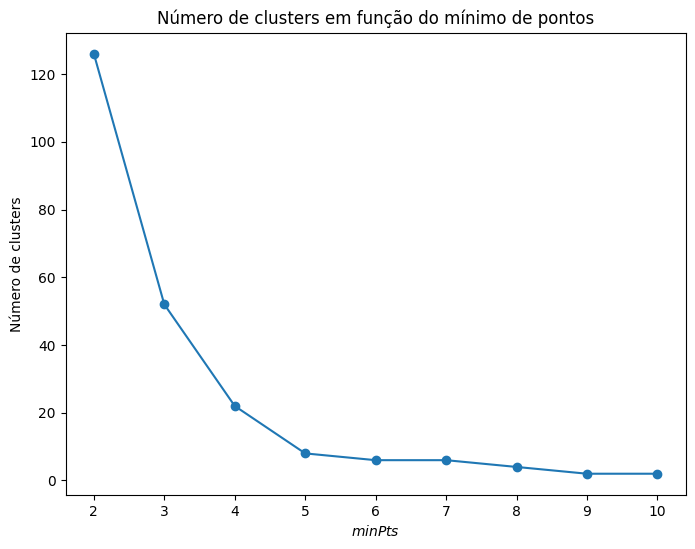

In [ ]:
plt.figure(figsize = (8,6))
plt.plot(minPts_values, n_clusters, marker = 'o')
plt.title('Número de clusters em função do mínimo de pontos')
plt.ylabel('Número de clusters')
plt.xlabel('$minPts$')

Testando com os resultados apresentados nos gráficos

DBSCAN com eps=0.2 e minPts=10
Número de clusters: 1


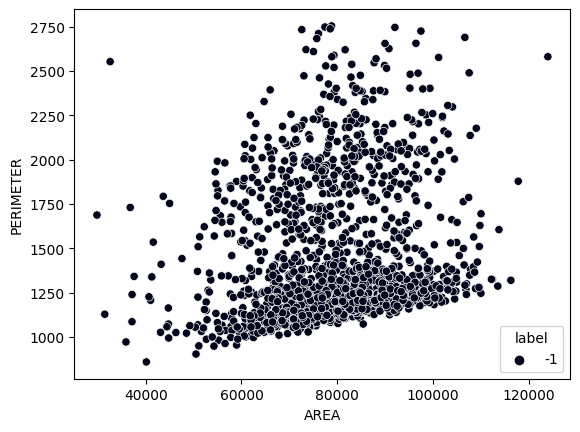

Quantidade de pontos em cada clusters:
-1    1718
dtype: int64


In [ ]:
df_result, n_clusters = plot_dbscan(df = df,
                                   eps = 0.2,
                                   min_samples= 10)

Procurando valor ótimo para 'eps' e 'min_samples'

In [ ]:
# Definir os valores iniciais de eps e min_pts
min_pts_values = range(1, 21)
eps_values = np.arange(0.1, 2.1, 0.1)

# Loop aninhado para testar diferentes valores de eps para cada min_pts
for min_pts in min_pts_values:
    for eps in eps_values:
        df_result, n_clusters = result_dbscan(df, eps, min_pts)

        if n_clusters == 3:
            break

    if n_clusters == 3:
        break

DBSCAN com eps=0.1 e minPts=1
Número de clusters: 1717
DBSCAN com eps=0.2 e minPts=1
Número de clusters: 1711
DBSCAN com eps=0.30000000000000004 e minPts=1
Número de clusters: 1683
DBSCAN com eps=0.4 e minPts=1
Número de clusters: 1586
DBSCAN com eps=0.5 e minPts=1
Número de clusters: 1412
DBSCAN com eps=0.6 e minPts=1
Número de clusters: 1161
DBSCAN com eps=0.7000000000000001 e minPts=1
Número de clusters: 908
DBSCAN com eps=0.8 e minPts=1
Número de clusters: 727
DBSCAN com eps=0.9 e minPts=1
Número de clusters: 554
DBSCAN com eps=1.0 e minPts=1
Número de clusters: 424
DBSCAN com eps=1.1 e minPts=1
Número de clusters: 310
DBSCAN com eps=1.2000000000000002 e minPts=1
Número de clusters: 237
DBSCAN com eps=1.3000000000000003 e minPts=1
Número de clusters: 173
DBSCAN com eps=1.4000000000000001 e minPts=1
Número de clusters: 131
DBSCAN com eps=1.5000000000000002 e minPts=1
Número de clusters: 104
DBSCAN com eps=1.6 e minPts=1
Número de clusters: 91
DBSCAN com eps=1.7000000000000002 e minP

plotando os valores encontrados

DBSCAN com eps=1.7 e minPts=6
Número de clusters: 3


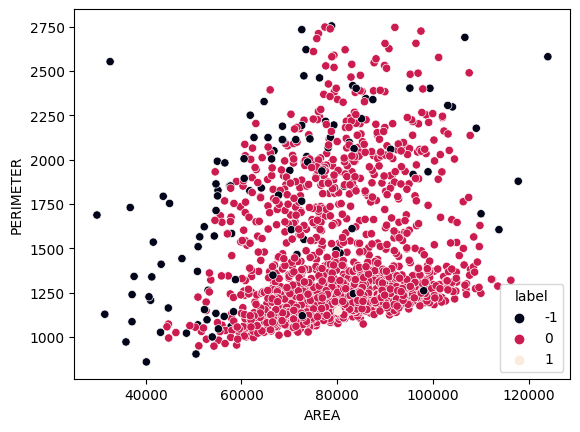

Quantidade de pontos em cada clusters:
 0    1581
-1     128
 1       9
dtype: int64


In [ ]:
df_result, n_clusters = plot_dbscan(df = df,
                                   eps = 1.7,
                                   min_samples= 6)

### Não encontramos valores satisfatórios utilizando o DBScan

## AgglomerativeClustering

In [ ]:
df = pd.read_csv('/content/pistachio.csv')
df['Class'] = df['Class'].replace({'Siit_Pistachio': 1, 'Kirmizi_Pistachio': 0})

In [ ]:
df_1 = df.copy()
df_1.drop(columns='Class', axis=1, inplace=True)

In [ ]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(df_1)

# Criar o modelo de agrupamento hierárquico
n_clusters = 2  # Número de clusters desejado
agglomerative_model = AgglomerativeClustering(n_clusters=n_clusters)

# Ajustar o modelo aos dados
labels = agglomerative_model.fit_predict(data_scaled)

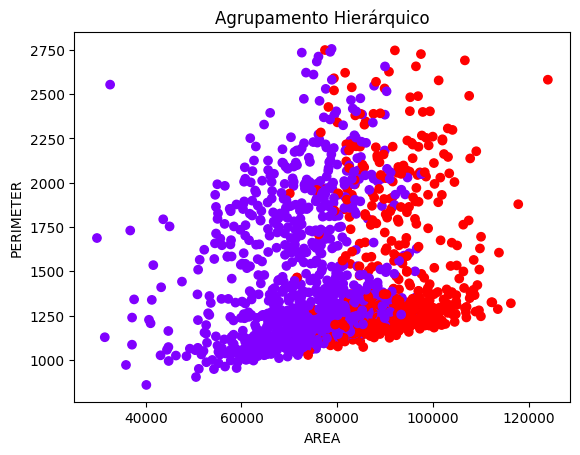

In [ ]:
# Plotar os resultados
plt.scatter(df['AREA'], df['PERIMETER'], c=labels, cmap='rainbow')
plt.title('Agrupamento Hierárquico')
plt.xlabel('AREA')
plt.ylabel('PERIMETER')
plt.show()

In [ ]:
df['cluster'] = agglomerative_model.labels_

comparar os resultados

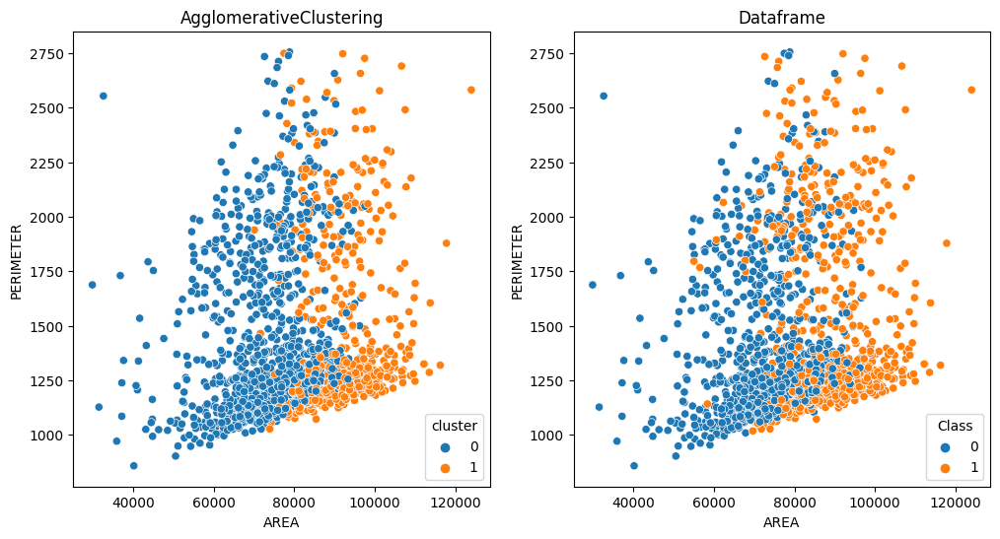

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Primeiro gráfico: scatterplot com 'cluster' como hue
sns.scatterplot(data=df, x = 'AREA', y='PERIMETER', hue='cluster', ax=axes[0])
axes[0].set_title('AgglomerativeClustering')

# Segundo gráfico: scatterplot com 'Class' como hue
sns.scatterplot(data=df, x='AREA', y='PERIMETER', hue='Class', ax=axes[1])
axes[1].set_title('Dataframe')

plt.show()

In [ ]:
# Calcula a porcentagem de acerto
percentual_acerto = (df['cluster'] == df['Class']).mean() * 100
print(f'Percentual de acerto: {percentual_acerto:.2f}%')

Percentual de acerto: 84.75%


Comparando os resultados:

| Algoritmo     | Precisão   |
|--------------|------------|
| KMeans       | 84,87%     |
| Agglomerative| 84,75%     |

## Dendograma

In [ ]:
# Calcular a matriz de ligação (linkage matrix) para o dendrograma
linkage_matrix = linkage(data_scaled, method='ward')

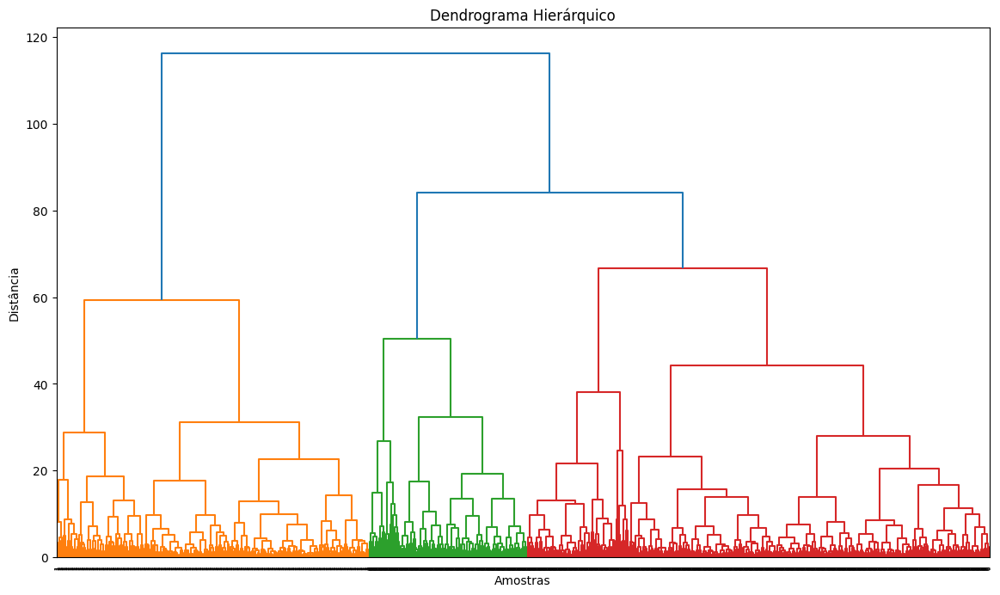

In [ ]:
# Plotar o dendrograma
plt.figure(figsize=(14, 8))
dendrogram(linkage_matrix, labels=labels)
plt.title('Dendrograma Hierárquico')
plt.xlabel('Amostras')
plt.ylabel('Distância')
plt.show()

## Reduzindo a dimensionalidade



In [ ]:
X = df.drop(columns = 'Class')
y = df['Class']
pca = PCA(n_components=2)
pca.fit(X)

PCA(n_components=2)

In [ ]:
df_PCA = pd.DataFrame(pca.transform(X), columns = ['PCA_1', 'PCA_2'])
df_PCA.shape

(1718, 2)

<Axes: xlabel='PCA_1', ylabel='PCA_2'>

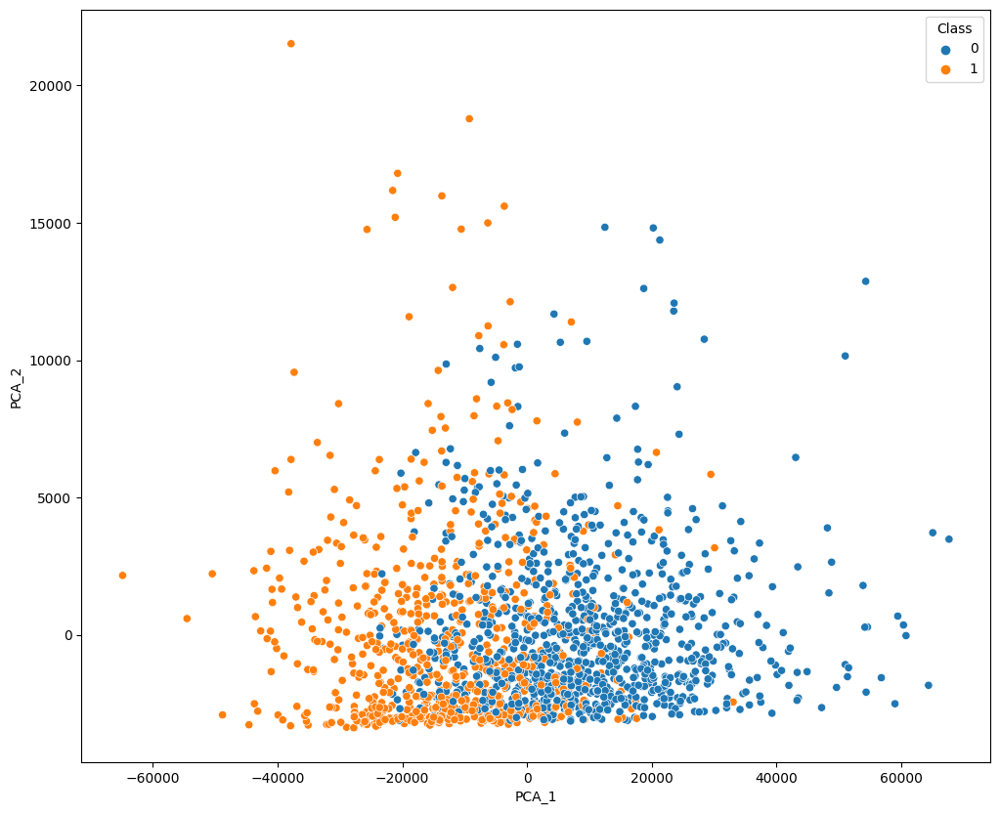

In [ ]:
plt.figure(figsize = (12,10))
sns.scatterplot(data = df_PCA,
               x = 'PCA_1',
               y = 'PCA_2',
              hue = df['Class'])


In [ ]:
pca.explained_variance_ratio_

array([0.97084601, 0.02898864])

<BarContainer object of 2 artists>

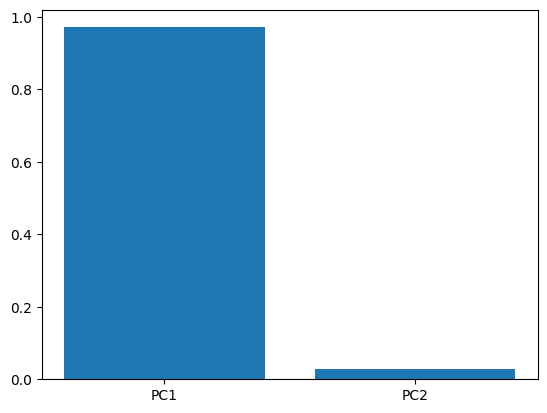

In [ ]:
plt.bar(['PC1', 'PC2'],pca.explained_variance_ratio_)